##Rajasthan_Precipitation


2020 - Processing bands 0 to 3
2020 - June: min=3.25, max=206.20


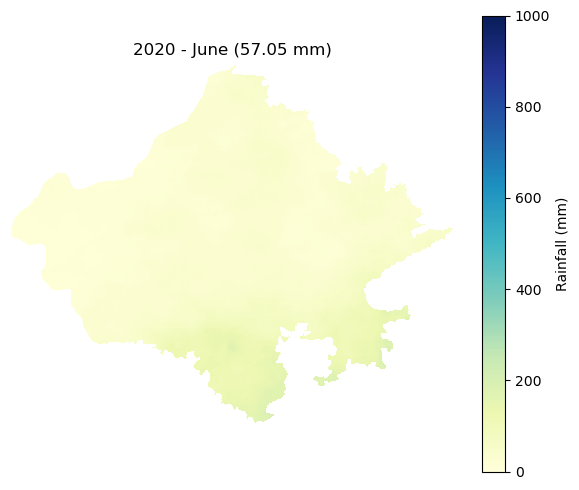

2020 - July: min=27.35, max=647.56


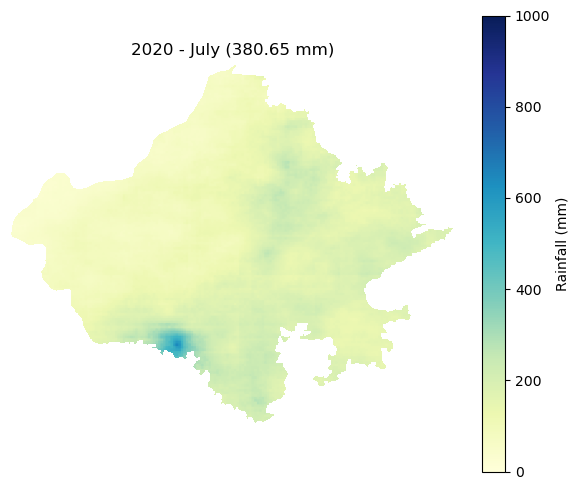

2020 - August: min=27.57, max=1022.96


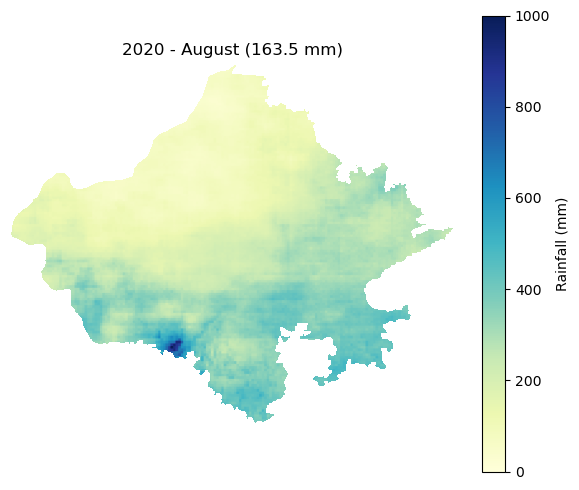

2020 - September: min=16.64, max=458.48


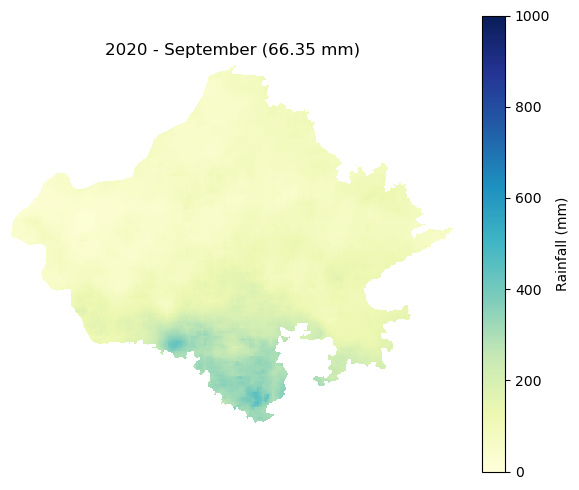

2020 - Total Rainfall (Rajasthan only): min=158.03 mm, max=2067.97 mm


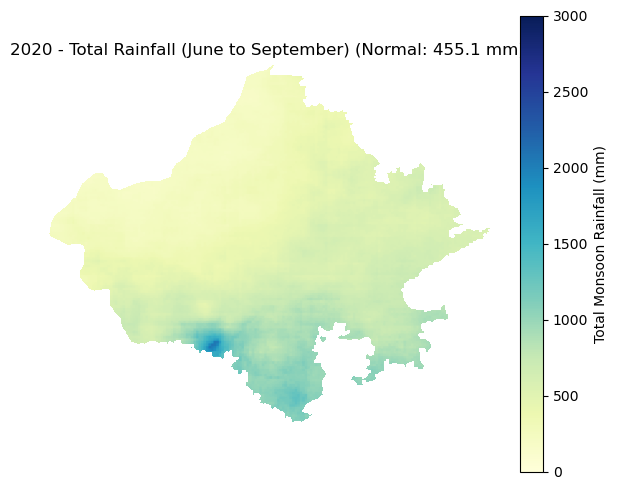


2021 - Processing bands 5 to 8
2021 - June: min=0.00, max=135.56


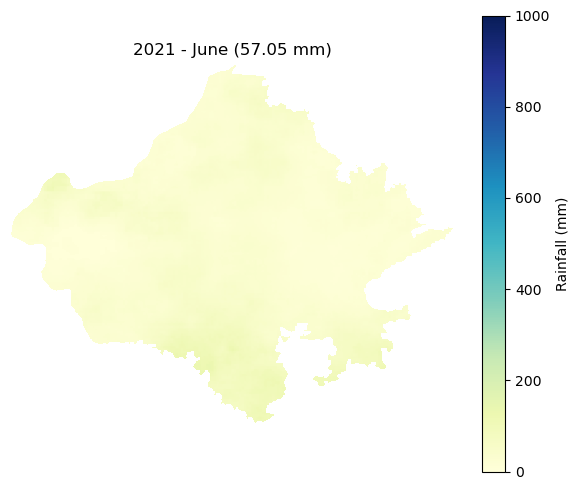

2021 - July: min=28.03, max=531.46


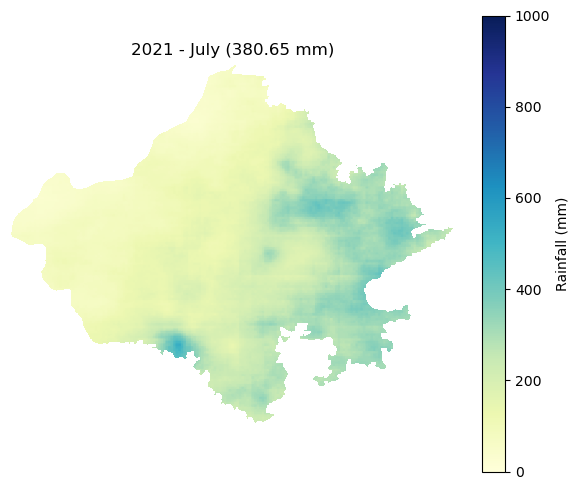

2021 - August: min=0.00, max=601.96


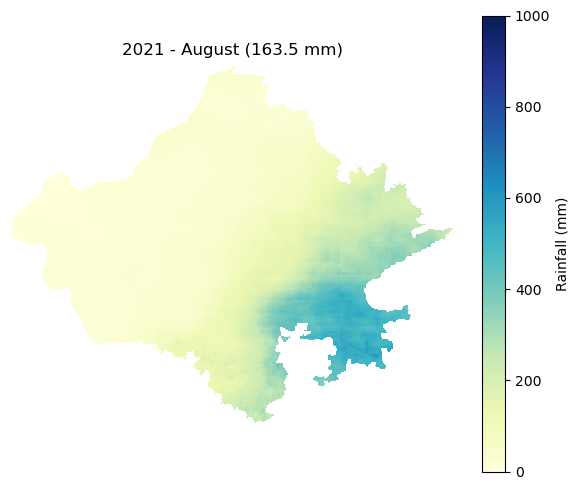

2021 - September: min=6.82, max=634.47


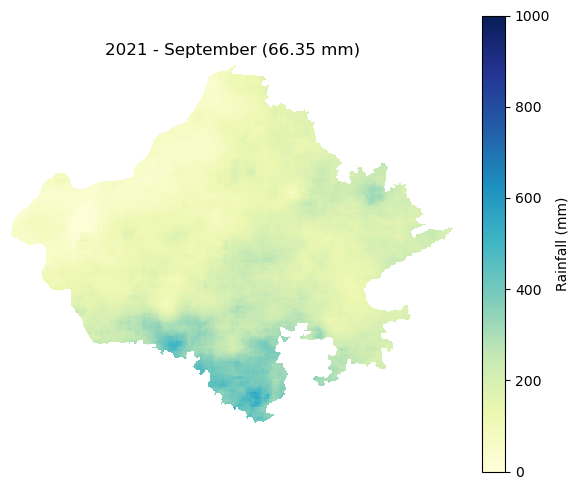

2021 - Total Rainfall (Rajasthan only): min=92.51 mm, max=1273.06 mm


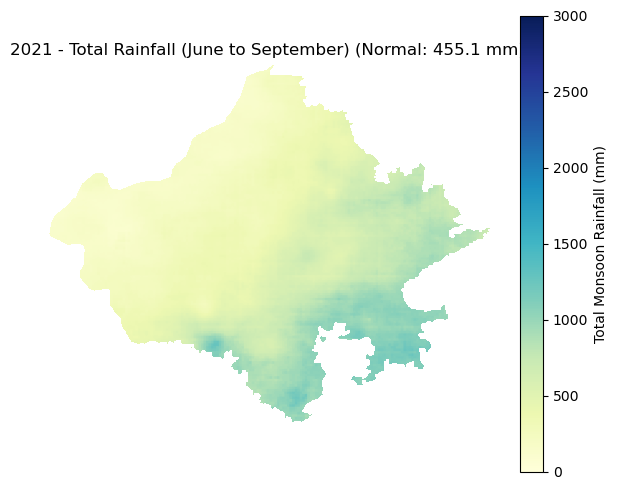


2022 - Processing bands 10 to 13
2022 - June: min=0.57, max=134.97


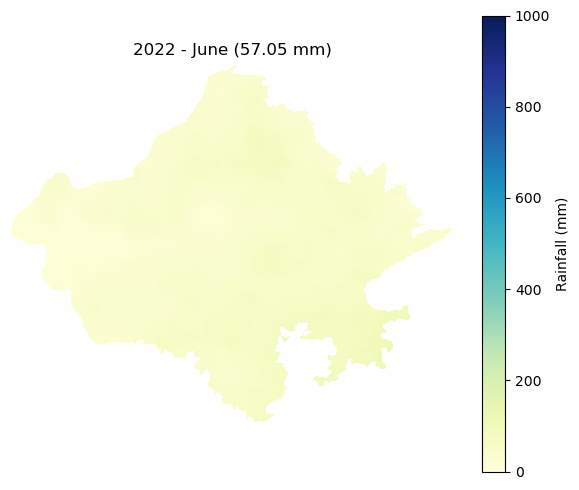

2022 - July: min=142.27, max=1315.77


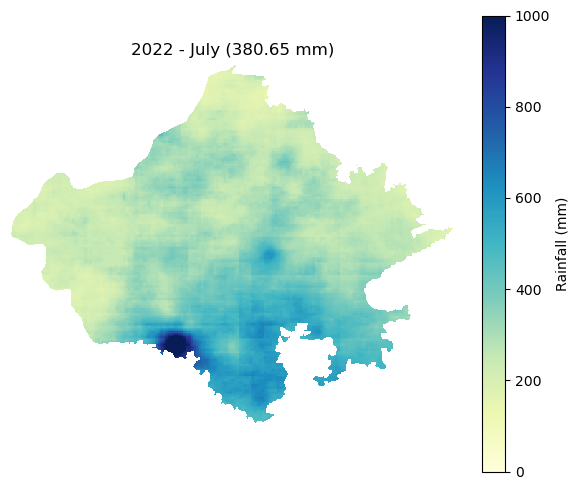

2022 - August: min=43.23, max=1155.17


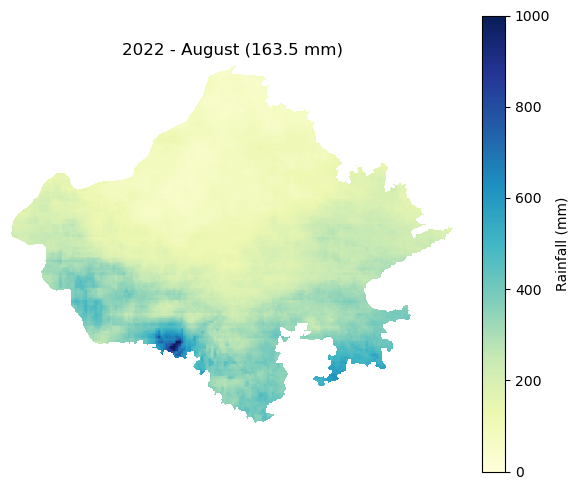

2022 - September: min=0.00, max=284.64


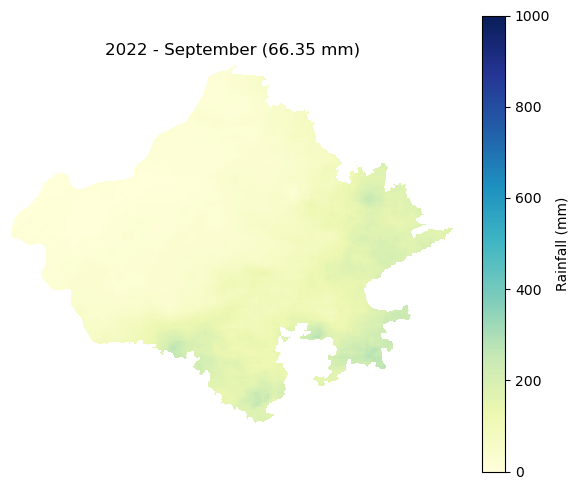

2022 - Total Rainfall (Rajasthan only): min=247.88 mm, max=2613.97 mm


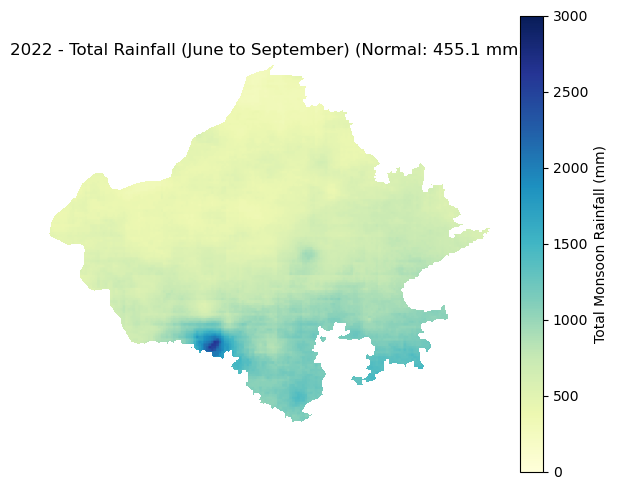


2023 - Processing bands 15 to 18
2023 - June: min=20.63, max=317.11


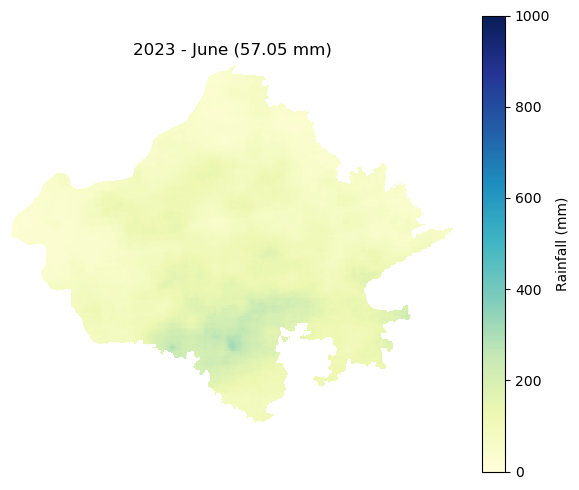

2023 - July: min=74.33, max=914.61


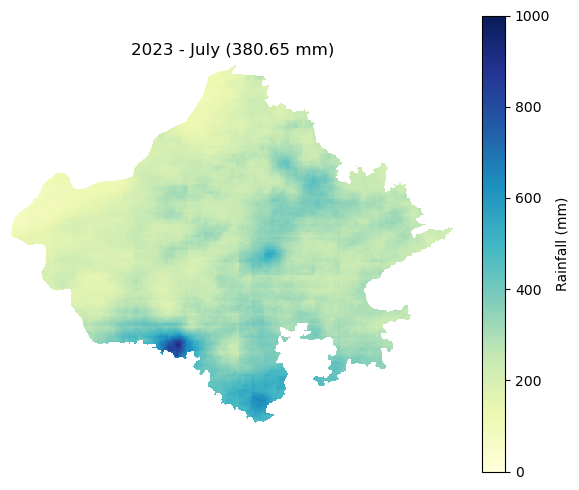

2023 - August: min=0.00, max=172.60


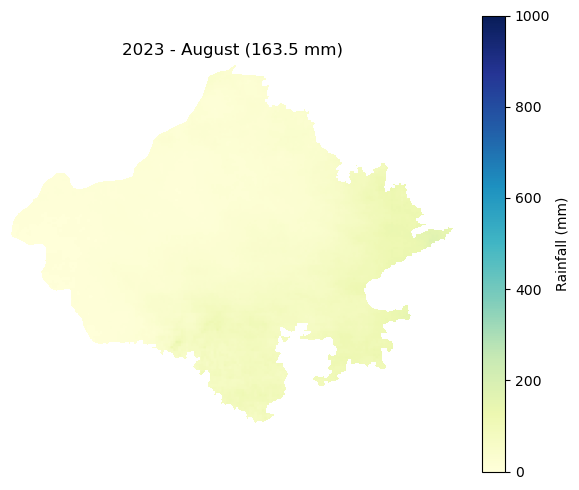

2023 - September: min=0.00, max=601.09


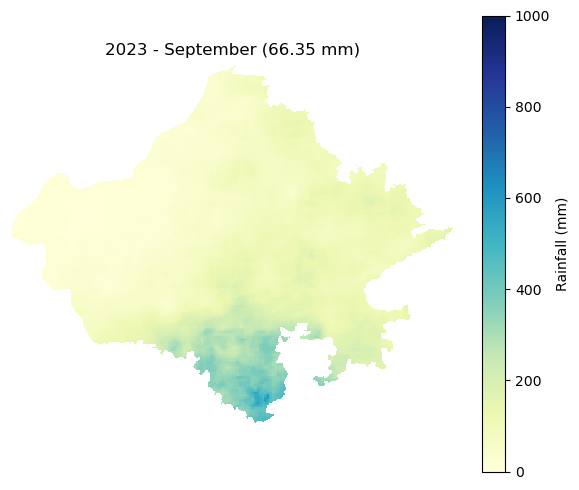

2023 - Total Rainfall (Rajasthan only): min=108.69 mm, max=1571.03 mm


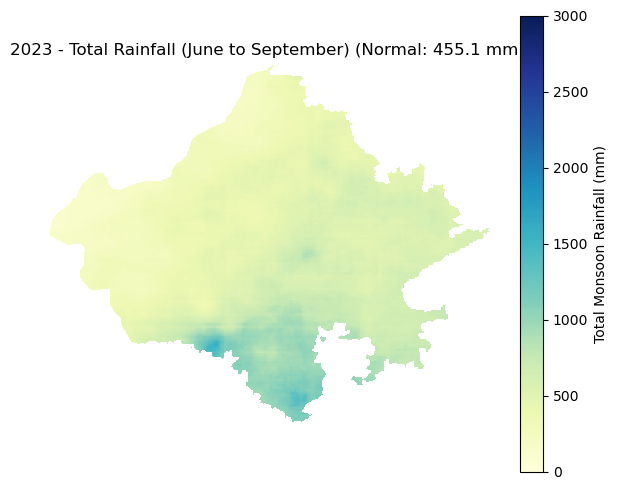


2024 - Processing bands 20 to 23
2024 - June: min=10.95, max=192.82


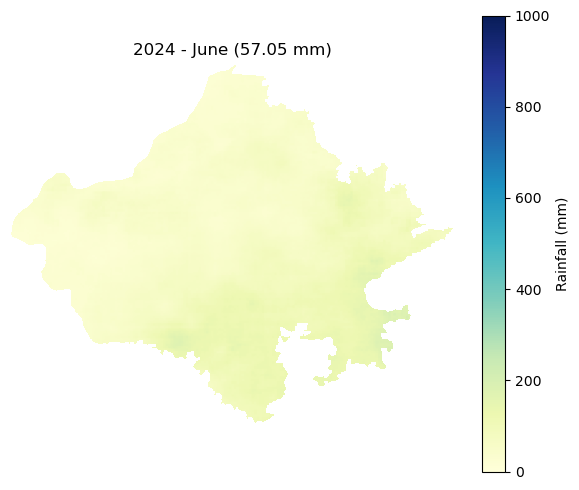

2024 - July: min=28.13, max=883.89


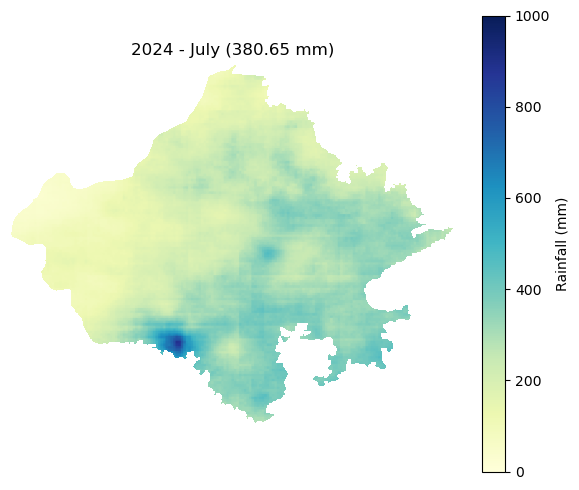

2024 - August: min=64.25, max=696.48


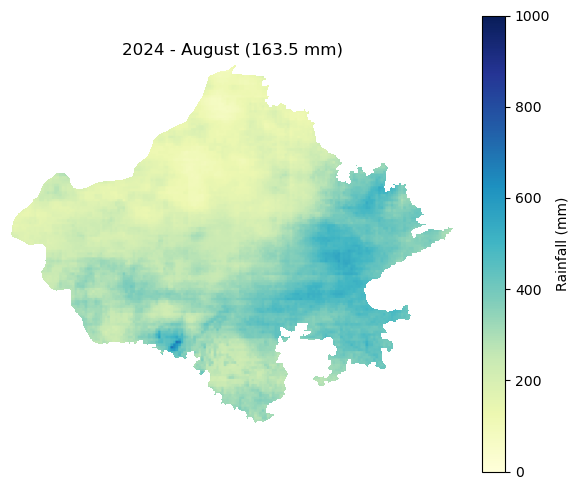

2024 - September: min=9.66, max=453.34


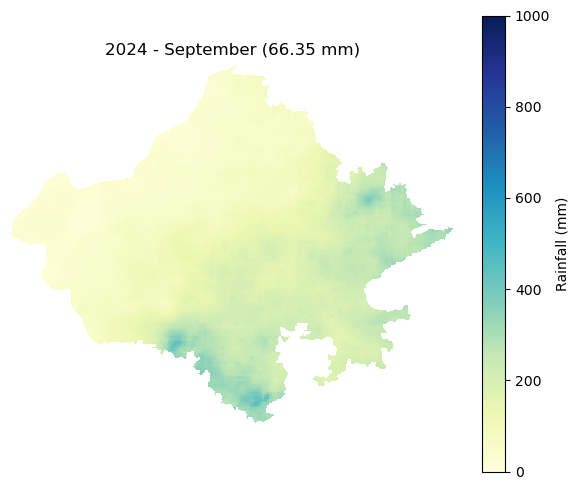

2024 - Total Rainfall (Rajasthan only): min=220.75 mm, max=2191.10 mm


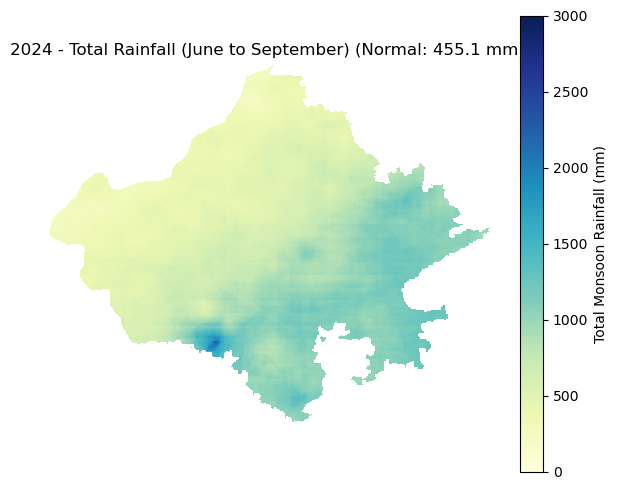

In [22]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import os

# --- Configuration for Rajasthan ---
tiff_path = "Rajasthan_Y_Precipitation_CHIRPS.tif"
shapefile_path = "SateMask/gadm41_IND_1.shp"
years = [2020, 2021, 2022, 2023, 2024]
band_names = ['June', 'July', 'August', 'September']
monthly_vmin, monthly_vmax = 0, 1000
total_vmin, total_vmax = 0, 3000
bands_per_year = 5  # 4 monsoon + 1 extra per year
normal = [57.05, 380.65, 163.5, 66.35]  # June, July, August, September
total_normal = 455.1  # Sum of normals

# --- Load Rajasthan boundary ---
gdf = gpd.read_file(shapefile_path)
rj_geom = gdf[gdf["NAME_1"] == "Rajasthan"].geometry.values[0]
geojson_geom = [rj_geom.__geo_interface__]

# --- Load CHIRPS TIFF ---
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"{tiff_path} not found.")

with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(float)
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

    needs_scaling = np.nanmax(all_bands) > 2000  # CHIRPS may need 0.01 scaling

    for year_idx, year in enumerate(years):
        start_band = year_idx * bands_per_year
        monsoon_bands = all_bands[start_band:start_band + 4]

        print(f"\n{year} - Processing bands {start_band} to {start_band+3}")

        # --- Plot each monsoon month ---
        for i in range(4):
            band = monsoon_bands[i]
            print(f"{year} - {band_names[i]}: min={np.nanmin(band):.2f}, max={np.nanmax(band):.2f}")

            plt.figure(figsize=(6, 5))
            plt.imshow(band, cmap='YlGnBu', vmin=monthly_vmin, vmax=monthly_vmax)
            plt.colorbar(label='Rainfall (mm)')
            plt.title(f"{year} - {band_names[i]} ({normal[i]} mm)")
            plt.axis('off')
            plt.tight_layout()
            plt.show()

        # --- Compute total rainfall ---
        if needs_scaling:
            monsoon_bands *= 1

        total_precip = np.nansum(monsoon_bands, axis=0)

        # --- Mask to Rajasthan boundary ---
        with MemoryFile() as memfile:
            with memfile.open(driver='GTiff',
                              height=total_precip.shape[0],
                              width=total_precip.shape[1],
                              count=1,
                              dtype='float32',
                              transform=transform,
                              crs=crs) as temp_ds:
                temp_ds.write(total_precip.astype('float32'), 1)

                total_precip_masked, _ = mask(temp_ds, geojson_geom, crop=False, filled=True, nodata=np.nan)
                total_precip_masked = total_precip_masked[0]
                total_precip_masked[total_precip_masked == 0] = np.nan

        # --- Plot total rainfall ---
        total_min, total_max = np.nanmin(total_precip_masked), np.nanmax(total_precip_masked)
        print(f"{year} - Total Rainfall (Rajasthan only): min={total_min:.2f} mm, max={total_max:.2f} mm")

        plt.figure(figsize=(6, 5))
        plt.imshow(total_precip_masked, cmap='YlGnBu', vmin=total_vmin, vmax=total_vmax)
        plt.colorbar(label='Total Monsoon Rainfall (mm)')
        plt.title(f"{year} - Total Rainfall (June to September) (Normal: {total_normal} mm) ")
        plt.axis('off')
        plt.tight_layout()
        plt.show()


In [ ]:
csv

In [17]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.mask import mask
from rasterio.io import MemoryFile
import pandas as pd
import os

# -----------------------------------------------------------------------------
# 1) CONFIGURATION (Rajasthan)
# -----------------------------------------------------------------------------
tiff_path       = "Rajasthan_Y_Precipitation_CHIRPS.tif"
shapefile_path  = "SateMask/gadm41_IND_1.shp"
years           = [2020, 2021, 2022, 2023, 2024]
band_names      = ['June', 'July', 'August', 'September']
bands_per_year  = 5

# “Normal” thresholds for monthly & total (these are your input constants)
monthly_normal = [57.05, 380.65, 163.5, 66.35]  # [June, July, August, Sept]
total_normal   = 455.1

# (Optional) If you want to enforce fixed color‐scale limits for plotting later:
monthly_vmin, monthly_vmax = 0, 1000
total_vmin, total_vmax     = 0, 3000

# -----------------------------------------------------------------------------
# 2) READ THE RAJASTHAN POLYGON AS A SINGLE-GEOMETRY
# -----------------------------------------------------------------------------
gdf = gpd.read_file(shapefile_path)
rj_geom = gdf[gdf["NAME_1"] == "Rajasthan"].geometry.values[0]
geojson_geom = [rj_geom.__geo_interface__]  # For rasterio.mask

# -----------------------------------------------------------------------------
# 3) PREPARE STORAGE FOR CSV RECORDS
# -----------------------------------------------------------------------------
all_records = []

# -----------------------------------------------------------------------------
# 4) OPEN THE MULTI‐BAND TIFF (and keep it open for indexing & masking)
# -----------------------------------------------------------------------------
if not os.path.exists(tiff_path):
    raise FileNotFoundError(f"Cannot find `{tiff_path}` in working directory.")

src = rasterio.open(tiff_path)
all_bands = src.read().astype(np.float32)  # shape: (total_bands, H, W)
height, width = src.height, src.width
transform, crs = src.transform, src.crs

# -----------------------------------------------------------------------------
# 5) DETERMINE IF SCALING IS NEEDED (e.g. CHIRPS in “×1000” units)
# -----------------------------------------------------------------------------
# (If your CHIRPS values are already in mm, then no scaling needed.)
# For example, if you see very large integer values (like 10000+), you might do:
#    needs_scaling = True
#    scale_factor = 0.001
# Then, whenever we read “band”, we’d multiply band *= scale_factor.
# As currently written, we’ll assume CHIRPS is already in mm, so no scaling.
#
needs_scaling = False
scale_factor = 1.0

# -----------------------------------------------------------------------------
# 6) LOOP OVER YEARS → MONTHLY + TOTAL PROCESSING
# -----------------------------------------------------------------------------
for year_idx, year in enumerate(years):
    start_band = year_idx * bands_per_year
    # Slice out the four monthly bands for this year
    monsoon_bands = all_bands[start_band : start_band + 4]  # shape (4, H, W)

    print(f"\n=== Year {year}: processing bands {start_band}–{start_band+3} ===")

    # === 6a) PROCESS EACH MONTH INDIVIDUALLY (masked to Rajasthan) ===
    for i in range(4):
        raw_band = monsoon_bands[i]  # 2D array (H, W)
        if needs_scaling:
            band = raw_band * scale_factor
        else:
            band = raw_band  # mm

        # -------------------------------------------------------------
        # Mask this single‐month layer to Rajasthan so that any pixel
        # outside the polygon becomes NaN.  We use a MemoryFile trick
        # to perform `rasterio.mask.mask` on just one band at a time.
        # -------------------------------------------------------------
        with MemoryFile() as memfile:
            with memfile.open(
                driver="GTiff",
                height=height,
                width=width,
                count=1,
                dtype="float32",
                transform=transform,
                crs=crs,
            ) as temp_ds:
                temp_ds.write(band.astype("float32"), 1)
                # Now mask out pixels outside Rajasthan → they become NaN
                masked_arr, _ = mask(
                    temp_ds,
                    geojson_geom,
                    crop=False,
                    filled=True,
                    nodata=np.nan
                )
                masked_arr = masked_arr[0]  # extract the single‐band 2D array

        # -------------------------------------------------------------
        # Now iterate over every valid (non‐NaN) pixel inside Rajasthan.
        # Zero rainfall (== 0) is still a valid “inside polygon” value,
        # so we’ll categorize it as “NA” rather than drop it.
        # -------------------------------------------------------------
        rows, cols = np.where(~np.isnan(masked_arr))
        print(f"  {year} – {band_names[i]}: ({len(rows)} pixels inside Rajasthan)")

        for (r, c) in zip(rows, cols):
            rainfall = masked_arr[r, c]  # float mm
            x, y = rasterio.transform.xy(transform, r, c)  # gives (lon, lat)

            # Assign category based on your thresholds
            if rainfall == 0:
                category = "NA"
            elif rainfall > 1.6 * monthly_normal[i]:
                category = "Large Excess"
            elif rainfall > 1.2 * monthly_normal[i]:
                category = "Excess"
            elif rainfall >= 0.8 * monthly_normal[i]:
                category = "Normal"
            elif rainfall >= 0.4 * monthly_normal[i]:
                category = "Deficit"
            else:  # rainfall > 0 but < 0.4 * normal
                category = "Scarcity"

            all_records.append({
                "Year": year,
                "Month": band_names[i],
                "Rainfall_mm": float(rainfall),
                "Latitude": float(y),
                "Longitude": float(x),
                "Category": category
            })

    # === 6b) COMPUTE & PROCESS “TOTAL MONSOON” FOR THIS YEAR ===
    # Sum the 4 monthly layers (still unmasked → but we will mask next)
    if needs_scaling:
        total_precip = np.nansum(monsoon_bands * scale_factor, axis=0)
    else:
        total_precip = np.nansum(monsoon_bands, axis=0)

    # Mask total_precip to Rajasthan (so outside → NaN; inside → remains 0 or >0)
    with MemoryFile() as memfile:
        with memfile.open(
            driver="GTiff",
            height=height,
            width=width,
            count=1,
            dtype="float32",
            transform=transform,
            crs=crs,
        ) as temp_ds:
            temp_ds.write(total_precip.astype("float32"), 1)
            total_masked, _ = mask(
                temp_ds,
                geojson_geom,
                crop=False,
                filled=True,
                nodata=np.nan
            )
            total_masked = total_masked[0]

    # Now iterate over pixels inside Rajasthan (non‐NaN in total_masked)
    rows, cols = np.where(~np.isnan(total_masked))
    print(f"  {year} – Total Monsoon: ({len(rows)} pixels inside Rajasthan)")

    for (r, c) in zip(rows, cols):
        rainfall = total_masked[r, c]
        x, y = rasterio.transform.xy(transform, r, c)

        if rainfall == 0:
            category = "NA"
        elif rainfall > 1.6 * total_normal:
            category = "Large Excess"
        elif rainfall > 1.2 * total_normal:
            category = "Excess"
        elif rainfall >= 0.8 * total_normal:
            category = "Normal"
        elif rainfall >= 0.4 * total_normal:
            category = "Deficit"
        else:
            category = "Scarcity"

        all_records.append({
            "Year": year,
            "Month": "Total",
            "Rainfall_mm": float(rainfall),
            "Latitude": float(y),
            "Longitude": float(x),
            "Category": category
        })

# -----------------------------------------------------------------------------
# 7) CLOSE THE RASTER
# -----------------------------------------------------------------------------
src.close()

# -----------------------------------------------------------------------------
# 8) SAVE ALL RECORDS OUT TO CSV (one line per Year×Month×Pixel)
# -----------------------------------------------------------------------------
df = pd.DataFrame(all_records)
df.to_csv("Rajasthan_Y_Precipitation_GT.csv", index=False)
print("Saved → Rajasthan_Y_Precipitation_GT.csv")



=== Year 2020: processing bands 0–3 ===
  2020 – June: (383958 pixels inside Rajasthan)
  2020 – July: (383958 pixels inside Rajasthan)
  2020 – August: (383958 pixels inside Rajasthan)
  2020 – September: (383958 pixels inside Rajasthan)
  2020 – Total Monsoon: (384000 pixels inside Rajasthan)

=== Year 2021: processing bands 5–8 ===
  2021 – June: (383958 pixels inside Rajasthan)
  2021 – July: (383958 pixels inside Rajasthan)
  2021 – August: (383958 pixels inside Rajasthan)
  2021 – September: (383958 pixels inside Rajasthan)
  2021 – Total Monsoon: (384000 pixels inside Rajasthan)

=== Year 2022: processing bands 10–13 ===
  2022 – June: (383958 pixels inside Rajasthan)
  2022 – July: (383958 pixels inside Rajasthan)
  2022 – August: (383958 pixels inside Rajasthan)
  2022 – September: (383958 pixels inside Rajasthan)
  2022 – Total Monsoon: (384000 pixels inside Rajasthan)

=== Year 2023: processing bands 15–18 ===
  2023 – June: (383958 pixels inside Rajasthan)
  2023 – July: (

Categorical GeoTIFF saved as: Rajasthan_Y_Precipitation_GT_geotif.tif


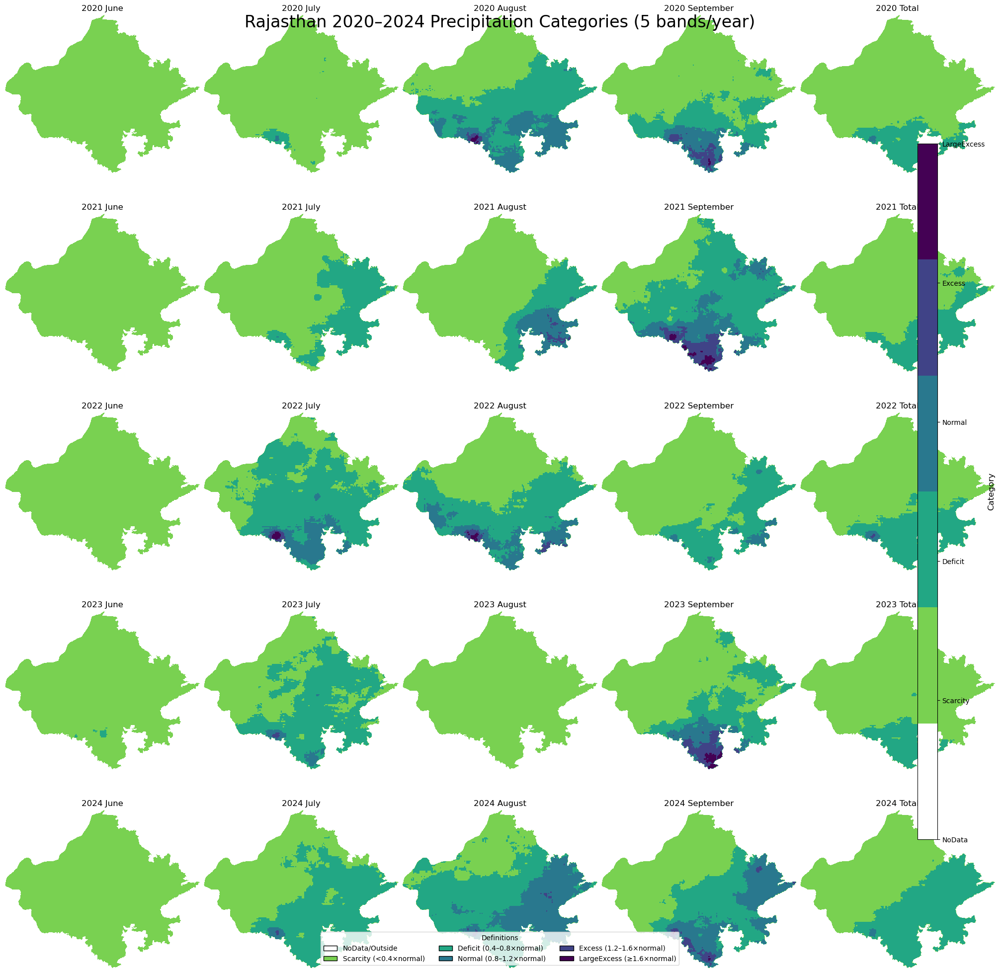

In [44]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) PATH TO YOUR 25‐BAND PRECIPITATION TIFF FOR RAJASTHAN
# -----------------------------------------------------------------------------
tiff_path = "Rajasthan_Y_Precipitation_CHIRPS.tif"
if not os.path.isfile(tiff_path):
    raise FileNotFoundError(f"Cannot find {tiff_path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ ALL 25 BANDS INTO A NumPy ARRAY
# -----------------------------------------------------------------------------
with rasterio.open(tiff_path) as src:
    all_bands = src.read().astype(np.float32)  # shape = (25, H, W)
    profile   = src.profile.copy()
    height, width = src.height, src.width

n_bands = all_bands.shape[0]
if n_bands != 25:
    raise ValueError(f"Expected 25 bands (2020–2024 × 5), but found {n_bands}")

# -----------------------------------------------------------------------------
# 3) DEFINE “NORMAL” VALUES FOR RAJASTHAN (June, July, August, September, Total)
# -----------------------------------------------------------------------------
normals = np.array([
    648.3,  # June
    653.5,  # July
    445.1,  # August
    271.8,  # September
    2018.7  # Total Monsoon
], dtype=np.float32)

# -----------------------------------------------------------------------------
# 4) CATEGORY THRESHOLDS (as MULTIPLES of “NORMAL”)
# -----------------------------------------------------------------------------
def categorize_precip(band_data: np.ndarray, normal_value: float) -> np.ndarray:
    cat = np.full(band_data.shape, -1, dtype=np.int8)
    mask_valid = ~np.isnan(band_data)
    vals = band_data[mask_valid]
    r = vals / normal_value

    c = np.full(vals.shape, -1, dtype=np.int8)
    c[r < 0.4]               = 0  # Scarcity
    c[(r >= 0.4) & (r < 0.8)] = 1  # Deficit
    c[(r >= 0.8) & (r < 1.2)] = 2  # Normal
    c[(r >= 1.2) & (r < 1.6)] = 3  # Excess
    c[r >= 1.6]               = 4  # LargeExcess

    cat[mask_valid] = c
    return cat

# -----------------------------------------------------------------------------
# 5) APPLY CATEGORIZATION TO ALL 25 BANDS
# -----------------------------------------------------------------------------
category_stack = np.full(all_bands.shape, -1, dtype=np.int8)
for i in range(n_bands):
    idx = i % 5
    category_stack[i] = categorize_precip(all_bands[i], normals[idx])

# -----------------------------------------------------------------------------
# 6) EXPORT THE CATEGORY STACK AS A NEW 25‐BAND GeoTIFF
#    Filename: “Rajasthan_Y_Precipitation_GT_geotif.tif”
# -----------------------------------------------------------------------------
out_profile = profile.copy()
out_profile.update(count=25, dtype=rasterio.int8, nodata=-1)

output_path = "Rajasthan_Y_Precipitation_GT_geotif.tif"
with rasterio.open(output_path, "w", **out_profile) as dst:
    dst.write(category_stack)

print(f"Categorical GeoTIFF saved as: {output_path}")

# -----------------------------------------------------------------------------
# 7) SET UP A DISCRETE COLORMAP FOR THE 5 CATEGORIES + “NoData” AS WHITE
# -----------------------------------------------------------------------------
colors = [
    "#ffffff",  # 0 = NoData
    "#79d151",  # 1 = Scarcity
    "#22a784",  # 2 = Deficit
    "#29788e",  # 3 = Normal
    "#404387",  # 4 = Excess
    "#440154"   # 5 = LargeExcess
]
cmap = ListedColormap(colors)
labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal (0.8–1.2×normal)",
    4: "Excess (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
handles = [Patch(facecolor=colors[i], edgecolor="black", label=labels[i]) for i in labels]

# -----------------------------------------------------------------------------
# 8) VISUALIZE ALL 25 CATEGORY LAYERS IN A 5×5 GRID
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September", "Total"]

fig, axes = plt.subplots(5, 5, figsize=(20, 20), constrained_layout=True)
fig.suptitle("Rajasthan 2020–2024 Precipitation Categories (5 bands/year)", fontsize=24, y=0.98)

for i in range(n_bands):
    r, c = divmod(i, 5)
    ax = axes[r, c]

    layer = category_stack[i]
    plot_arr = np.zeros_like(layer, dtype=np.int8)
    valid = layer != -1
    plot_arr[valid] = layer[valid] + 1  # shift codes 0→1…4→5;  -1→0

    ax.imshow(plot_arr, cmap=cmap, vmin=0, vmax=5)
    ax.set_title(f"{years[r]} {month_names[c]}", fontsize=12)
    ax.axis("off")

# colorbar
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cb = plt.colorbar(
    plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=5)),
    cax=cax, ticks=[0,1,2,3,4,5]
)
cb.ax.set_yticklabels(["NoData","Scarcity","Deficit","Normal","Excess","LargeExcess"])
cb.set_label("Category", rotation=90, fontsize=12)

# legend
fig.legend(handles=handles, loc="lower center", ncol=3, frameon=True,
           title="Definitions", bbox_to_anchor=(0.5, 0.02))

plt.show()


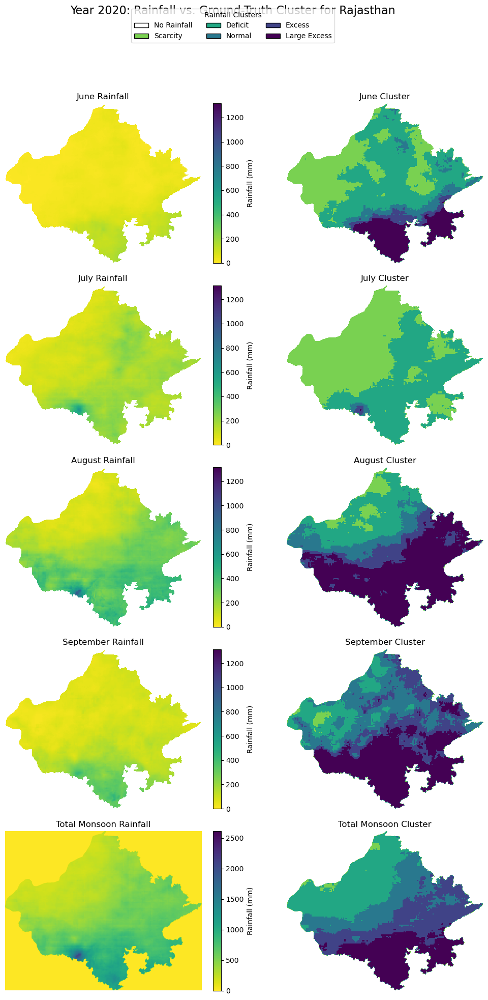

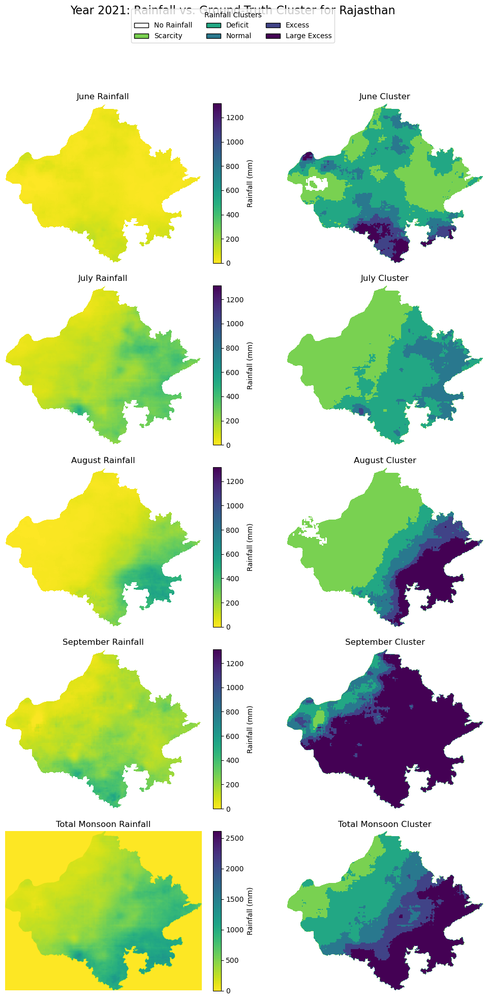

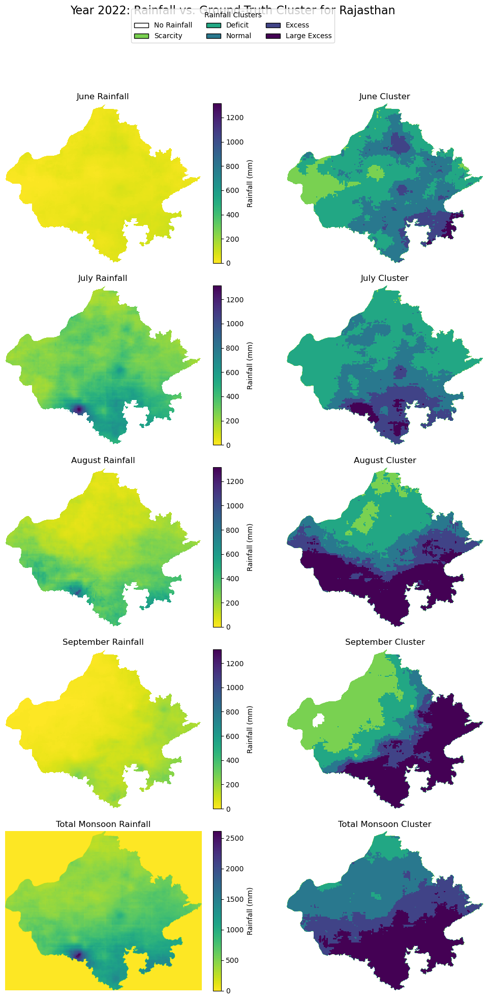

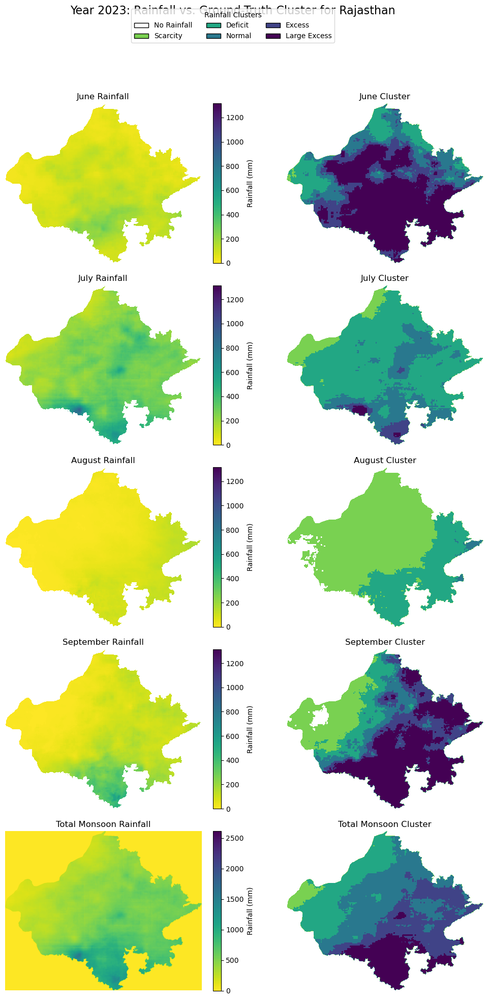

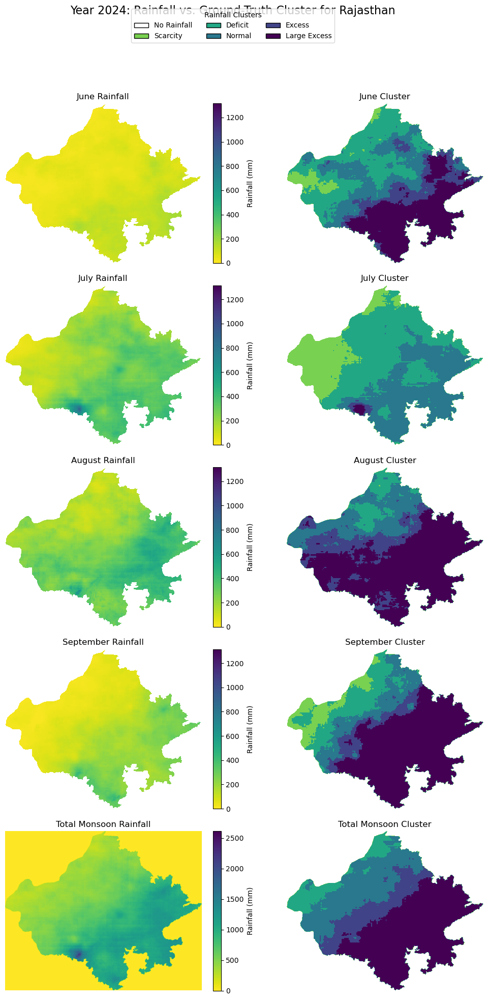

In [18]:
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if necessary)
# -----------------------------------------------------------------------------
tiff_path = "Rajasthan_Y_Precipitation_CHIRPS.tif"
csv_path  = "Rajasthan_Y_Precipitation_GT.csv"

# -----------------------------------------------------------------------------
# 2) LOAD THE CSV (must contain columns: Year, Month, Latitude, Longitude, Category)
# -----------------------------------------------------------------------------
df = pd.read_csv(csv_path)

# -----------------------------------------------------------------------------
# 3) OPEN THE MULTI‐BAND TIFF (keep it open for indexing later)
# -----------------------------------------------------------------------------
src = rasterio.open(tiff_path)
all_bands = src.read()              # shape: (total_bands, rows, cols)
height, width = src.height, src.width

# -----------------------------------------------------------------------------
# 4) CONFIGURATION
# -----------------------------------------------------------------------------
start_year      = 2020
bands_per_year  = 5   # (4 months + 1 “Total” band) each year
month_to_index  = {
    "June":      0,
    "July":      1,
    "August":    2,
    "September": 3,
    "Total":     4
}
band_names      = ['June', 'July', 'August', 'September']
# (we’ll still generate “Total” in code by summing monthly bands)

# -----------------------------------------------------------------------------
# 5) CALCULATE vmin/vmax FOR RAINFALL (monthly & total) ACROSS THE ENTIRE TIFF
# -----------------------------------------------------------------------------
# 5a) Stack all monthly‐bands (20 = 4 months × 5 years) to find min/max
monthly_stack_all = []
for yidx in range(5):
    base = yidx * bands_per_year
    monthly_stack_all.append(all_bands[base:base+4].astype(np.float32))
monthly_stack_all = np.concatenate(monthly_stack_all, axis=0)  # shape: (20, H, W)
vmin_month = np.nanmin(monthly_stack_all)
vmax_month = np.nanmax(monthly_stack_all)

# 5b) Compute “Total” for each year (sum of its 4 monthly bands) → stack to get vmin_total/vmax_total
total_list = []
for yidx in range(5):
    base = yidx * bands_per_year
    this4 = all_bands[base:base+4].astype(np.float32)
    total_list.append(np.nansum(this4, axis=0))   # shape: (H, W)
total_stack = np.stack(total_list, axis=0)        # shape: (5, H, W)
vmin_total = np.nanmin(total_stack)
vmax_total = np.nanmax(total_stack)

# -----------------------------------------------------------------------------
# 6) BUILD A CUSTOM “CLUSTER” COLORMAP
# -----------------------------------------------------------------------------
cluster_to_id = {
    'no rainfall':  0,
    'scarcity':     1,
    'deficit':      2,
    'normal':       3,
    'excess':       4,
    'large excess': 5
}
max_cid = len(cluster_to_id) - 1  # = 5

# 6a) Colors: index=0 → white; indices 1–5 → viridis_r
base_cmap = plt.get_cmap('viridis_r')
colors = []
for cid in range(max_cid + 1):
    if cid == 0:
        colors.append('#ffffff')
    else:
        frac = cid / max_cid
        colors.append(base_cmap(frac))

cluster_cmap = ListedColormap(colors)
legend_handles = [
    Patch(facecolor=colors[cid], edgecolor='black', label=label.title())
    for label, cid in cluster_to_id.items()
]

# -----------------------------------------------------------------------------
# 7) FOR EACH YEAR: PLOT 5 ROWS × 2 COLUMNS → (rainfall vs. cluster)
# -----------------------------------------------------------------------------
for year_idx, year in enumerate(range(start_year, start_year + 5)):
    # 7a) Extract the four monthly rainfall bands for this year
    base = year_idx * bands_per_year
    monthly_bands = all_bands[base:base+4].astype(np.float32)

    # 7b) Compute that year’s “Total Monsoon” rainfall (sum of 4 months)
    total_precip = np.nansum(monthly_bands, axis=0)

    # 7c) Build a 5×H×W “cluster ID” array: indices 0..3 = months, index 4 = “Total”
    cluster_stack = np.zeros((5, height, width), dtype=np.uint8)

    # Limit df to this year
    df_year = df[df['Year'] == year]

    # 7d) Fill monthly clusters (indices 0..3) AND “Total” (index=4) if CSV has Month="Total"
    for idx, row in df_year.iterrows():
        raw_m = row['Month']
        m = str(raw_m).strip()
        if m not in month_to_index:
            continue
        band_idx = month_to_index[m]  # 0..4

        lat = float(row['Latitude'])
        lon = float(row['Longitude'])
        try:
            r, c = src.index(lon, lat)
        except Exception:
            continue
        if not (0 <= r < height and 0 <= c < width):
            continue

        cat_str = str(row['Category']).strip().lower()
        cid = cluster_to_id.get(cat_str, 0)
        cluster_stack[band_idx, r, c] = cid

    # 7e) We will NOT mask total_precip by cluster_stack[4]--we want to see the rainfall.
    #     If you’d like to mask outside the Rajasthan boundary, you can add a shapefile-based mask here.

    # 7f) Build a “rain_cmap” that paints invalid data (NaN) as white
    rain_cmap = plt.get_cmap('viridis_r').copy()
    rain_cmap.set_bad('white')

    # 7g) Plot everything
    fig, axs = plt.subplots(5, 2, figsize=(12, 20))
    fig.suptitle(f"Year {year}: Rainfall vs. Ground‐Truth Cluster for Rajasthan", fontsize=16)

    # Rows 0..3: June, July, August, September
    for i in range(4):
        # Left: monthly rainfall
        im0 = axs[i, 0].imshow(
            monthly_bands[i],
            cmap='viridis_r',
            vmin=vmin_month,
            vmax=vmax_month
        )
        axs[i, 0].set_title(f"{band_names[i]} Rainfall")
        axs[i, 0].axis('off')
        plt.colorbar(im0, ax=axs[i, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

        # Right: monthly cluster
        im1 = axs[i, 1].imshow(
            cluster_stack[i],
            cmap=cluster_cmap,
            vmin=0,
            vmax=max_cid
        )
        axs[i, 1].set_title(f"{band_names[i]} Cluster")
        axs[i, 1].axis('off')

    # Row 4: Total Monsoon
    # Left: combined rainfall (no mask)
    im_tot = axs[4, 0].imshow(
        total_precip,
        cmap=rain_cmap,
        vmin=vmin_total,
        vmax=vmax_total
    )
    axs[4, 0].set_title("Total Monsoon Rainfall")
    axs[4, 0].axis('off')
    plt.colorbar(im_tot, ax=axs[4, 0], fraction=0.046, pad=0.04, label='Rainfall (mm)')

    # Right: “Total” cluster (if CSV had Month="Total")
    im_clust_tot = axs[4, 1].imshow(
        cluster_stack[4],
        cmap=cluster_cmap,
        vmin=0,
        vmax=max_cid
    )
    axs[4, 1].set_title("Total Monsoon Cluster")
    axs[4, 1].axis('off')

    # Shared Legend at top
    fig.legend(
        handles=legend_handles,
        loc='upper center',
        ncol=3,
        frameon=True,
        title="Rainfall Clusters",
        bbox_to_anchor=(0.5, 0.98)
    )

    # Tight layout
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# -----------------------------------------------------------------------------
# 8) CLOSE THE RASTER
# -----------------------------------------------------------------------------
src.close()


In [ ]:
##Rajasthan_X_LST

In [ ]:
// --------------------------------------------------------------------------------
// Compute Monthly‐Mean LST for Rajasthan (June–September, 2020–2024)
// using MODIS/061/MOD11A1. We will produce 5 years × 4 months = 20 bands, stack them
// into one 20‐band GeoTIFF, and export as “Rajasthan_X_LST.tif”.
// --------------------------------------------------------------------------------

// 0. Load India level‐1 boundaries and filter for Rajasthan
var states     = ee.FeatureCollection("FAO/GAUL/2015/level1");
var rajasthan  = states.filter(ee.Filter.eq('ADM1_NAME', 'Rajasthan'));
Map.centerObject(rajasthan, 7);
Map.addLayer(rajasthan, { color: 'black' }, 'Rajasthan Boundary');

// 1. Define years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 2. Visualization parameters for LST (°C)
var visLST = {
  min:     0,
  max:     50,
  palette: ['blue', 'green', 'yellow', 'orange', 'red']
};

// 3. Collect all monthly‐mean LST bands (4 months × 5 years = 20 bands)
var allBands = [];

years.forEach(function(year) {
  months.forEach(function(m, idx) {
    // 3a. Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');
    
    // 3b. Compute monthly‐mean LST from MODIS
    var monthlyLST = ee.ImageCollection('MODIS/061/MOD11A1')
      .filterDate(start, end)
      .filterBounds(rajasthan)
      .select('LST_Day_1km')
      .mean()
      .multiply(0.02)        // scale factor
      .subtract(273.15)      // Kelvin → Celsius
      .clip(rajasthan)
      .rename(year + '_' + monthNames[idx] + '_LST');
    
    allBands.push(monthlyLST);
    
    // 3c. Visualize monthly LST
    Map.addLayer(
      monthlyLST,
      visLST,
      year + ' ' + monthNames[idx] + ' LST'
    );
  });
});

// 4. Stack all 20 bands into one multi‐band image
var finalImage = ee.Image.cat(allBands);

// 5. Export that 20‐band image to Google Drive
Export.image.toDrive({
  image:          finalImage,
  description:    'Rajasthan_X_LST',
  folder:         'GEE_Exports',
  fileNamePrefix: 'Rajasthan_X_LST',
  region:         rajasthan.geometry(),
  scale:          1000,       // native resolution of MOD11A1
  crs:            'EPSG:4326',
  maxPixels:      1e13
});

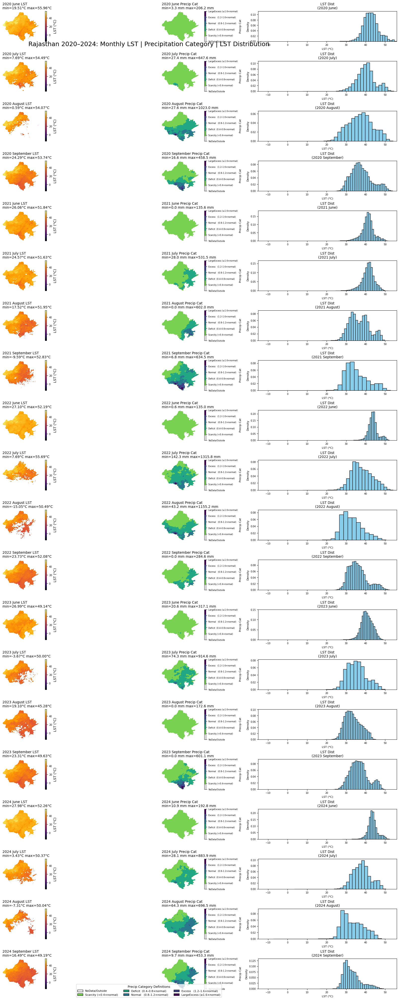

In [49]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - LST TIFF:               20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Precipitation RAW TIFF: 25 bands (2020–2024 × 5 bands: June, July, August, September, Total)
#    - Precipitation Category: 25 bands (2020–2024 × 5 category bands)
#
#  For Rajasthan, we assume:
#    Rajasthan_X_LST.tif
#    Rajasthan_Y_Precipitation_CHIRPS.tif
#    Rajasthan_Y_Precipitation_GT_geotif.tif
# -----------------------------------------------------------------------------
lst_tiff_path        = "Rajasthan_X_LST.tif"
precip_raw_tiff_path = "Rajasthan_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path = "Rajasthan_Y_Precipitation_GT_geotif.tif"

for p in (lst_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ THE 20‐BAND LST TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(lst_tiff_path) as src_lst:
    lst_bands = src_lst.read().astype(np.float32)  # shape = (20, H, W)
    height, width = src_lst.height, src_lst.width

n_lst_bands = lst_bands.shape[0]
if n_lst_bands != 20:
    raise ValueError(f"Expected 20 bands in {lst_tiff_path}, but found {n_lst_bands}")

# -----------------------------------------------------------------------------
# 3) READ THE 25‐BAND RAW PRECIPITATION TIFF (monthly sums in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = precip_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw}")

# -----------------------------------------------------------------------------
# 4) READ THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = precip_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat}")

# -----------------------------------------------------------------------------
# 5) EXTRACT ONLY THE 20 MONTHLY PRECIP BANDS
#    (drop each year's "Total" at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for year_idx in range(5):
    base = year_idx * 5
    monthly_indices.extend([base + 0, base + 1, base + 2, base + 3])

precip_raw_bands = precip_raw_full[monthly_indices, :, :]  # (20, H, W)
precip_cat_bands = precip_cat_full[monthly_indices, :, :]  # (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS ARRAYS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
#    a) LST: continuous "inferno" from observed min to max
#    b) Precipitation category: discrete 6 colors (0..5)
# -----------------------------------------------------------------------------
# 7a) Compute LST vmin/vmax across all 20 bands
all_lst_vals = lst_bands.flatten()
all_lst_vals = all_lst_vals[~np.isnan(all_lst_vals)]
lst_vmin = float(np.nanmin(all_lst_vals)) if all_lst_vals.size else 0.0
lst_vmax = float(np.nanmax(all_lst_vals)) if all_lst_vals.size else 50.0
lst_cmap = plt.get_cmap("inferno")

# 7b) Precipitation category colormap (shift codes -1..4 → 0..5)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity         (orig code 0)
    "#22a784",  # 2 = Deficit          (orig code 1)
    "#29788e",  # 3 = Normal           (orig code 2)
    "#404387",  # 4 = Excess           (orig code 3)
    "#440154"   # 5 = LargeExcess      (orig code 4)
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
#    Col 0 = LST map | Col 1 = Precip Category map | Col 2 = LST distribution histogram
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Rajasthan 2020–2024: Monthly LST | Precipitation Category | LST Distribution",
    fontsize=18, y=0.96
)

# If only one row, ensure axes is 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # --- LST layer & stats ---
    lst_layer = lst_bands[i]
    valid_lst = lst_layer[~np.isnan(lst_layer)]
    lst_min = float(np.nanmin(valid_lst)) if valid_lst.size else np.nan
    lst_max = float(np.nanmax(valid_lst)) if valid_lst.size else np.nan

    # --- Precipitation raw stats ---
    pr_layer = precip_raw_bands[i]
    valid_pr = pr_layer[~np.isnan(pr_layer)]
    pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else np.nan
    pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else np.nan

    # --- Precipitation category plot array ---
    raw_cat = precip_cat_bands[i]
    cat_plot = np.zeros(raw_cat.shape, dtype=np.int8)
    mask_valid = (raw_cat != -1)
    cat_plot[mask_valid] = raw_cat[mask_valid] + 1  # now in {1..5}

    # Column 0: LST map
    ax0 = axes[i, 0]
    im0 = ax0.imshow(lst_layer, cmap=lst_cmap, vmin=lst_vmin, vmax=lst_vmax)
    ax0.set_title(f"{year} {month} LST\nmin={lst_min:.2f}°C max={lst_max:.2f}°C", loc="left", fontsize=10)
    ax0.axis("off")
    c0 = fig.colorbar(im0, ax=ax0, orientation="vertical", fraction=0.04, pad=0.04)
    c0.set_label("LST (°C)"); c0.ax.tick_params(labelsize=7)

    # Column 1: Precipitation category map
    ax1 = axes[i, 1]
    im1 = ax1.imshow(cat_plot, cmap=cluster_cmap, vmin=0, vmax=5)
    ax1.set_title(f"{year} {month} Precip Cat\nmin={pr_min:.1f} mm max={pr_max:.1f} mm", loc="left", fontsize=10)
    ax1.axis("off")
    c1 = fig.colorbar(im1, ax=ax1, orientation="vertical", fraction=0.04, pad=0.04)
    c1.set_ticks([0,1,2,3,4,5])
    c1.set_ticklabels([cluster_labels[k] for k in range(6)])
    c1.ax.tick_params(labelsize=6); c1.set_label("Precip Cat", fontsize=8)

    # Column 2: LST distribution histogram
    ax2 = axes[i, 2]
    if valid_lst.size:
        ax2.hist(valid_lst.flatten(), bins=30, density=True, edgecolor="black", color="skyblue")
        ax2.set_xlim(lst_vmin, lst_vmax)
    else:
        ax2.text(0.5, 0.5, "No Data", ha="center", va="center", fontsize=8, color="gray")
    ax2.set_title(f"LST Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("LST (°C)", fontsize=8); ax2.set_ylabel("Density", fontsize=8)
    ax2.tick_params(labelsize=7)

# -----------------------------------------------------------------------------
# 9) ADD A LEGEND FOR PRECIPITATION CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Rajasthan_X_NVDI

In [ ]:
// --------------------------------------------------------------------------------
// Compute Monthly‐Mean NDVI for Rajasthan (June–September, 2020–2024)
// using MODIS/061/MOD13A2 (16‐day, 500 m). We will produce
// 5 years × 4 months = 20 bands, stack them into one 20-band GeoTIFF,
// and export as “Rajasthan_X_NDVI.tif”.
// --------------------------------------------------------------------------------

// 0. Load Indian states boundary and filter for Rajasthan
var states     = ee.FeatureCollection("FAO/GAUL/2015/level1");
var rajasthan  = states.filter(ee.Filter.eq('ADM1_NAME', 'Rajasthan'));
Map.centerObject(rajasthan, 6);
Map.addLayer(rajasthan, { color: 'black' }, 'Rajasthan');

// 1. Define years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 2. Define visualization parameters for NDVI (–1 to 1) with eight‐color palette
var visNDVI = {
  min: -1,
  max: 1,
  palette: [
    'brown',      // very low NDVI
    'red',
    'orange',
    'yellow',
    'lightblue',
    'navy',
    'lightgreen',
    'green'       // very high NDVI
  ]
};

// 3. Collect all monthly‐mean NDVI bands (4 months × 5 years = 20 bands)
var allBands = [];

years.forEach(function(year) {
  months.forEach(function(m, idx) {
    // 3.1 Define start and end of the month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');
    
    // 3.2 Compute monthly‐mean NDVI
    var monthlyNDVI = ee.ImageCollection('MODIS/061/MOD13A2')
      .filterDate(start, end)
      .filterBounds(rajasthan)
      .select('NDVI')
      .mean()
      .multiply(0.0001)       // scale factor (NDVI × 0.0001)
      .clip(rajasthan)
      .rename(year + '_' + monthNames[idx] + '_NDVI');
    
    allBands.push(monthlyNDVI);
    
    // 3.3 Visualize on the map
    Map.addLayer(
      monthlyNDVI,
      visNDVI,
      year + ' ' + monthNames[idx] + ' NDVI'
    );
  });
});

// 4. Stack all 20 bands into one multi‐band image
var finalImage = ee.Image.cat(allBands);

// 5. Export that 20‐band image to Google Drive as a single GeoTIFF
Export.image.toDrive({
  image:          finalImage,
  description:    'Rajasthan_X_NDVI',  // Task name
  folder:         'GEE_Exports',       // Change folder if desired
  fileNamePrefix: 'Rajasthan_X_NDVI',  // Output will be “Rajasthan_X_NDVI.tif”
  region:         rajasthan.geometry(),
  scale:          1000,                // 500 m native resolution of MOD13A2
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


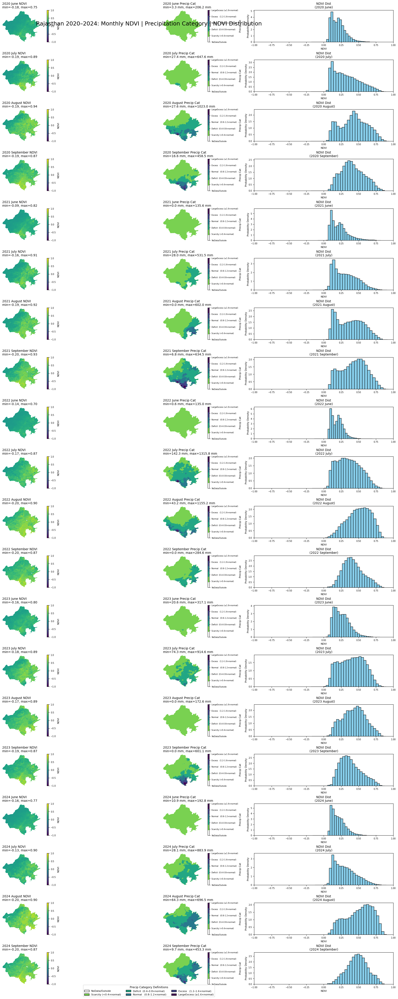

In [53]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
# -----------------------------------------------------------------------------
ndvi_tiff_path       = "Rajasthan_X_NDVI.tif"
precip_raw_tiff_path = "Rajasthan_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path = "Rajasthan_Y_Precipitation_GT_geotif.tif"
india_shapefile      = "SateMask/gadm41_IND_1.shp"  # contains all Indian states

for path in (ndvi_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND NDVI TIFF (2020–2024 × 4 months)
# -----------------------------------------------------------------------------
with rasterio.open(ndvi_tiff_path) as src_nd:
    ndvi_bands     = src_nd.read().astype(np.float32)  # shape = (20, H, W)
    ndvi_transform = src_nd.transform
    ndvi_crs       = src_nd.crs
    height, width  = src_nd.height, src_nd.width
    bounds         = src_nd.bounds

n_ndvi_bands = ndvi_bands.shape[0]
if n_ndvi_bands != 20:
    raise ValueError(f"Expected 20 bands in {ndvi_tiff_path}, but found {n_ndvi_bands}")

# 2a) Load India shapefile and extract Rajasthan, reproject to NDVI CRS
gdf = gpd.read_file(india_shapefile)
gdf_state = gdf[gdf["NAME_1"].str.lower() == "rajasthan"].copy()
if gdf_state.empty:
    raise ValueError("No feature named 'Rajasthan' found in shapefile.")

if gdf_state.crs != ndvi_crs:
    gdf_state = gdf_state.to_crs(ndvi_crs)

# 2b) Build a boolean mask (True = inside Rajasthan)
geom = [gdf_state.geometry.union_all()]
state_mask = geometry_mask(
    geom,
    transform=ndvi_transform,
    invert=True,
    out_shape=(height, width)
)

# 2c) Set pixels outside Rajasthan → NaN
for i in range(n_ndvi_bands):
    band = ndvi_bands[i]
    band[~state_mask] = np.nan
    ndvi_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ THE 25-BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr_raw:
    precip_raw_full = src_pr_raw.read().astype(np.float32)  # shape = (25, H, W)

n_pr_raw = precip_raw_full.shape[0]
if n_pr_raw != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {n_pr_raw}")

# 3a) Mask raw precipitation outside Rajasthan → NaN
for i in range(n_pr_raw):
    arr = precip_raw_full[i]
    arr[~state_mask] = np.nan
    precip_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ THE 25-BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pr_cat:
    precip_cat_full = src_pr_cat.read().astype(np.int8)  # shape = (25, H, W)

n_pr_cat = precip_cat_full.shape[0]
if n_pr_cat != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {n_pr_cat}")

# 4a) Mask precip categories outside Rajasthan → code = -1
for i in range(n_pr_cat):
    arr = precip_cat_full[i]
    arr[~state_mask] = -1
    precip_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for yr_idx in range(5):
    base = yr_idx * 5
    monthly_indices.extend([base + j for j in range(4)])

precip_raw_bands = precip_raw_full[monthly_indices, :, :]  # shape = (20, H, W)
precip_cat_bands = precip_cat_full[monthly_indices, :, :]  # shape = (20, H, W)

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)       # 5
n_months    = len(month_names) # 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
# -----------------------------------------------------------------------------
# 7a) NDVI colormap: continuous “viridis” from –1 to 1
ndvi_cmap = plt.get_cmap("viridis")
ndvi_vmin, ndvi_vmax = -1.0, 1.0

# 7b) Precip category palette (shift codes -1..4 → 0..5)
cluster_colors = [
    "#ffffff",  # 0 = NoData/Outside (orig code -1)
    "#79d151",  # 1 = Scarcity       (orig code 0)
    "#22a784",  # 2 = Deficit        (orig code 1)
    "#29788e",  # 3 = Normal         (orig code 2)
    "#404387",  # 4 = Excess         (orig code 3)
    "#440154"   # 5 = LargeExcess    (orig code 4)
]
cluster_cmap    = ListedColormap(cluster_colors)
cluster_labels  = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(len(cluster_colors))
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(22, n_total * 2.2),
    constrained_layout=True
)
fig.suptitle(
    "Rajasthan 2020–2024: Monthly NDVI | Precipitation Category | NDVI Distribution",
    fontsize=18, y=0.98
)

if n_total == 1:
    axes = axes[np.newaxis, :]

# -----------------------------------------------------------------------------
# 9) LOOP OVER ALL 20 MONTHS (i = 0..19)
# -----------------------------------------------------------------------------
for i in range(n_total):
    yr_idx  = i // n_months
    mo_idx  = i % n_months
    year    = years[yr_idx]
    month   = month_names[mo_idx]

    # NDVI stats
    ndvi_layer = ndvi_bands[i]
    valid_ndvi = ndvi_layer[~np.isnan(ndvi_layer)]
    ndvi_min = float(np.nanmin(valid_ndvi)) if valid_ndvi.size else None
    ndvi_max = float(np.nanmax(valid_ndvi)) if valid_ndvi.size else None

    # Precip stats
    raw_pr = precip_raw_bands[i]
    valid_pr = raw_pr[~np.isnan(raw_pr)]
    pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else None
    pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else None

    # Precip category plot array
    raw_cat = precip_cat_bands[i]
    cat_plot = np.zeros_like(raw_cat, dtype=np.int8)
    mask_valid = raw_cat != -1
    cat_plot[mask_valid] = raw_cat[mask_valid] + 1

    # Column 0: NDVI map
    ax0 = axes[i, 0]
    im0 = ax0.imshow(ndvi_layer, cmap=ndvi_cmap, vmin=ndvi_vmin, vmax=ndvi_vmax,
                     extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
                     origin="upper")
    title0 = f"{year} {month} NDVI"
    if ndvi_min is not None:
        title0 += f"\nmin={ndvi_min:.2f}, max={ndvi_max:.2f}"
    ax0.set_title(title0, fontsize=10, loc="left")
    ax0.axis("off")
    cbar0 = fig.colorbar(im0, ax=ax0, orientation="vertical", fraction=0.04, pad=0.04)
    cbar0.set_label("NDVI", fontsize=8); cbar0.ax.tick_params(labelsize=7)

    # Column 1: Precipitation category map
    ax1 = axes[i, 1]
    im1 = ax1.imshow(cat_plot, cmap=cluster_cmap, vmin=0, vmax=5,
                     extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
                     origin="upper")
    title1 = f"{year} {month} Precip Cat"
    if pr_min is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, fontsize=10, loc="left")
    ax1.axis("off")
    cbar1 = fig.colorbar(im1, ax=ax1, orientation="vertical", fraction=0.04, pad=0.04)
    cbar1.set_ticks([0,1,2,3,4,5]); cbar1.set_ticklabels([cluster_labels[k] for k in range(6)], fontsize=6)
    cbar1.set_label("Precip Cat", fontsize=8)

    # Column 2: NDVI distribution histogram
    ax2 = axes[i, 2]
    if valid_ndvi.size:
        ax2.hist(valid_ndvi.flatten(), bins=30, density=True, edgecolor="black", color="skyblue")
        ax2.set_xlim(ndvi_vmin, ndvi_vmax)
    else:
        ax2.text(0.5, 0.5, "No Data", ha="center", va="center", fontsize=8, color="gray")
    ax2.set_title(f"NDVI Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("NDVI", fontsize=8); ax2.set_ylabel("Probability Density", fontsize=8)
    ax2.tick_params(labelsize=7)

# -----------------------------------------------------------------------------
# 10) Legend for Precipitation Categories
# -----------------------------------------------------------------------------
fig.legend(handles=cluster_handles, loc="lower center", ncol=3, frameon=True,
           title="Precip Category Definitions", bbox_to_anchor=(0.5, -0.005),
           fontsize=8, title_fontsize=9)

plt.show()


In [ ]:
##Rajasthan_X_Relative_Humidity

In [ ]:

// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Relative Humidity for Rajasthan (June–September, 2020–2024)
// using ERA5‐Land Hourly data. Stack all 20 months into one 20‐band GeoTIFF
// named “Rajasthan_X_Relative_Humidity.tif”.
// --------------------------------------------------------------------------------

// 0. Load Indian states boundary and filter for Rajasthan
var states     = ee.FeatureCollection("FAO/GAUL/2015/level1");
var rajasthan  = states.filter(ee.Filter.eq('ADM1_NAME', 'Rajasthan'));
Map.centerObject(rajasthan, 7);
Map.addLayer(rajasthan, { color: 'black' }, 'Rajasthan Boundary');

// 1. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 2. Define visualization parameters for Relative Humidity (0–100%)
//    with an eight‐color reversed palette (very high RH → red down to blue)
var visRH = {
  min: 0,
  max: 100,
  palette: [
    'red',       // very high RH
    'orange',
    'yellow',
    'white',
    'green',
    'cyan',
    'lightblue',
    'blue'       // very low RH
  ]
};

// 3. Function to compute daily RH from ERA5‐Land fields
function computeDailyRH(image) {
  var t2m  = image.select('temperature_2m');
  var td2m = image.select('dewpoint_temperature_2m');
  var T  = t2m.subtract(273.15);
  var Td = td2m.subtract(273.15);
  var a = 17.625;
  var b = 243.04;
  var eTd = Td.multiply(a).divide(Td.add(b)).exp();
  var eT  = T.multiply(a).divide(T.add(b)).exp();
  return eTd.divide(eT).multiply(100).rename('RH')
             .copyProperties(image, image.propertyNames());
}

// 4. Loop over each year & month to compute monthly‐mean RH
var allBands = [];

years.forEach(function(year) {
  months.forEach(function(m, idx) {
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    var era5Daily = ee.ImageCollection('ECMWF/ERA5_LAND/HOURLY')
                       .filterDate(start, end)
                       .filterBounds(rajasthan)
                       .select(['temperature_2m', 'dewpoint_temperature_2m'])
                       .map(computeDailyRH)
                       .select('RH');

    var monthlyRH = era5Daily
                      .mean()
                      .clip(rajasthan)
                      .rename(year + '_' + monthNames[idx] + '_RH');

    allBands.push(monthlyRH);

    Map.addLayer(
      monthlyRH,
      visRH,
      year + ' ' + monthNames[idx] + ' RH (%)'
    );
  });
});

// 5. Stack all 20 monthly RH bands into one multi‐band image
var rhMultiband = ee.Image.cat(allBands);

// 6. Export the 20‐band RH image to Google Drive
Export.image.toDrive({
  image:          rhMultiband,
  description:    'Rajasthan_X_Relative_Humidity',  
  folder:         'GEE_Exports',                
  fileNamePrefix: 'Rajasthan_X_Relative_Humidity',  
  region:         rajasthan.geometry(),             
  scale:          1000,                         
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


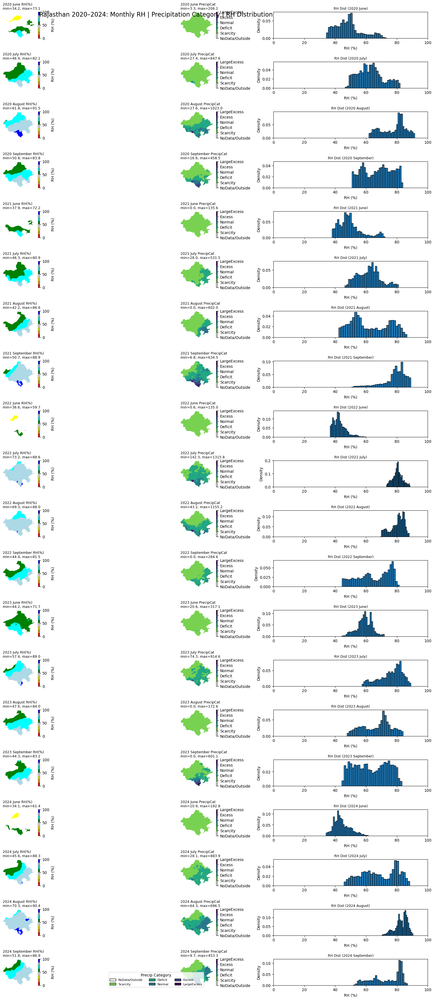

In [57]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - Relative Humidity TIFF:       20 bands (June–Sept 2020–2024)
#    - Raw Precipitation TIFF:       25 bands (2020–2024 × 5: Jun, Jul, Aug, Sep, Total)
#    - Precipitation Category TIFF:  25 bands (2020–2024 × 5 category bands)
#    - Rajasthan mask shapefile:     "SateMask/gadm41_IND_1.shp"
# -----------------------------------------------------------------------------
rh_tiff_path        = "Rajasthan_X_Relative_Humidity.tif"
precip_raw_tiff     = "Rajasthan_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Rajasthan_Y_Precipitation_GT_geotif.tif"
states_shapefile    = "SateMask/gadm41_IND_1.shp"

for path in (rh_tiff_path, precip_raw_tiff, precip_cat_tiff, states_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND RELATIVE HUMIDITY TIFF
# -----------------------------------------------------------------------------
with rasterio.open(rh_tiff_path) as src_rh:
    rh_bands      = src_rh.read().astype(np.float32)  # shape = (20, H, W)
    rh_transform  = src_rh.transform
    rh_crs        = src_rh.crs
    height, width = src_rh.height, src_rh.width
    rh_bounds     = src_rh.bounds

if rh_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {rh_tiff_path}, but found {rh_bands.shape[0]}")

# 2a) Load Rajasthan from the shapefile and reproject to match RH CRS
gdf = gpd.read_file(states_shapefile)
gdf_state = gdf[gdf["NAME_1"].str.lower() == "rajasthan"].copy()
if gdf_state.empty:
    raise ValueError("No feature named 'Rajasthan' found in shapefile.")
if gdf_state.crs != rh_crs:
    gdf_state = gdf_state.to_crs(rh_crs)

# 2b) Union geometry and mask
state_geom = [gdf_state.geometry.union_all()]
mask = geometry_mask(state_geom, transform=rh_transform, invert=True, out_shape=(height, width))

# 2c) Apply mask: outside → NaN
for i in range(rh_bands.shape[0]):
    band = rh_bands[i]
    band[~mask] = np.nan
    rh_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25‐BAND RAW PRECIPITATION TIFF (in mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)

if pr_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, but found {pr_raw_full.shape[0]}")

for i in range(pr_raw_full.shape[0]):
    arr = pr_raw_full[i]
    arr[~mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)

if pr_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, but found {pr_cat_full.shape[0]}")

for i in range(pr_cat_full.shape[0]):
    arr = pr_cat_full[i]
    arr[~mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIP BANDS (drop totals at 4,9,14,19,24)
# -----------------------------------------------------------------------------
monthly_idx = []
for y in range(5):
    base = y * 5
    monthly_idx.extend([base, base+1, base+2, base+3])

pr_raw_bands = pr_raw_full[monthly_idx]
pr_cat_bands = pr_cat_full[monthly_idx]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_months    = 4
n_total     = 5 * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & GLOBAL STATS
# -----------------------------------------------------------------------------
# 7a) RH palette
rh_cmap = ListedColormap(['red','orange','yellow','white','green','cyan','lightblue','blue'])
rh_vmin, rh_vmax = 0, 100

# 7b) Precip category palette
cat_colors = ["#ffffff","#79d151","#22a784","#29788e","#404387","#440154"]
cat_cmap   = ListedColormap(cat_colors)
cat_labels = {
    0: "NoData/Outside",1: "Scarcity",2: "Deficit",3: "Normal",4: "Excess",5: "LargeExcess"
}

# -----------------------------------------------------------------------------
# 8) PLOT GRID: 20 rows × 3 cols [RH map | PrecipCat map | RH histogram]
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(n_total, 3, figsize=(20, n_total*1.8), constrained_layout=True)
fig.suptitle("Rajasthan 2020–2024: Monthly RH | Precipitation Category | RH Distribution", fontsize=16, y=0.99)

for i in range(n_total):
    yi, mi = divmod(i, n_months)
    year, month = years[yi], month_names[mi]
    # RH layer
    rh_layer = rh_bands[i]
    vrh = rh_layer[~np.isnan(rh_layer)]
    rh_min, rh_max = (float(vrh.min()), float(vrh.max())) if vrh.size else (None,None)
    # Precip raw stats
    pr = pr_raw_bands[i]
    vpr = pr[~np.isnan(pr)]
    pr_min, pr_max = (float(vpr.min()), float(vpr.max())) if vpr.size else (None,None)
    # Precip cat shift
    cat = pr_cat_bands[i]
    plot_cat = np.zeros_like(cat)
    m = cat!=-1
    plot_cat[m] = cat[m]+1

    # Col0: RH map
    ax0 = axes[i,0]
    im0 = ax0.imshow(rh_layer, cmap=rh_cmap, vmin=rh_vmin, vmax=rh_vmax)
    t0 = f"{year} {month} RH(%)" + (f"\nmin={rh_min:.1f}, max={rh_max:.1f}" if rh_min is not None else "")
    ax0.set_title(t0, loc="left", fontsize=9); ax0.axis("off")
    fig.colorbar(im0, ax=ax0, fraction=0.046, pad=0.02, label="RH (%)")

    # Col1: Precip Cat map
    ax1 = axes[i,1]
    im1 = ax1.imshow(plot_cat, cmap=cat_cmap, vmin=0, vmax=5)
    t1 = f"{year} {month} PrecipCat" + (f"\nmin={pr_min:.1f}, max={pr_max:.1f}" if pr_min is not None else "")
    ax1.set_title(t1, loc="left", fontsize=9); ax1.axis("off")
    cb1 = fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.02)
    cb1.set_ticks(range(6)); cb1.set_ticklabels([cat_labels[k] for k in range(6)])

    # Col2: RH histogram
    ax2 = axes[i,2]
    if vrh.size:
        ax2.hist(vrh, bins=30, density=True, edgecolor="black")
        ax2.set_xlim(rh_vmin, rh_vmax)
    else:
        ax2.text(0.5,0.5,"No Data",ha="center",va="center",color="gray")
    ax2.set_title(f"RH Dist ({year} {month})", fontsize=9)
    ax2.set_xlabel("RH (%)"); ax2.set_ylabel("Density")

# Legend for precip categories
handles = [Patch(facecolor=cat_colors[i], edgecolor="black", label=cat_labels[i]) for i in range(6)]
fig.legend(handles=handles, loc="lower center", ncol=3, title="Precip Category", frameon=True, bbox_to_anchor=(0.5,0.01), fontsize=8)
plt.show()


In [ ]:
##Rajasthan_X_Wind_Speed

In [ ]:

// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Wind Speed for Rajasthan (June–September, 2020–2024)
// using ERA5‐Land Hourly data (“ECMWF/ERA5_LAND/HOURLY”). We will produce
// 5 years × 4 months = 20 single‐band images, stack them into a single 20‐band
// GeoTIFF, and export as “Rajasthan_X_Wind_Speed.tif”.
// --------------------------------------------------------------------------------

// 1. Load Rajasthan boundary from GAUL level1 and display it
var states    = ee.FeatureCollection("FAO/GAUL/2015/level1");
var rajasthan = states.filter(ee.Filter.eq('ADM1_NAME', 'Rajasthan'));
Map.centerObject(rajasthan, 6);
Map.addLayer(rajasthan, { color: 'black' }, 'Rajasthan Boundary');

// 2. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 3. Build a list of single‐band wind‐speed images (one per year & month)
var allBands = [];

// 3a. Loop over each year
years.forEach(function(year) {
  // 3b. Loop over each monsoon month (6=June, 7=July, 8=August, 9=September)
  months.forEach(function(m, idx) {
    // 3b.1 Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 3b.2 Load ERA5‐Land Hourly data for this month & Rajasthan, selecting u & v at 10 m
    var era5 = ee.ImageCollection("ECMWF/ERA5_LAND/HOURLY")
                  .filterDate(start, end)
                  .filterBounds(rajasthan)
                  .select(['u_component_of_wind_10m', 'v_component_of_wind_10m']);

    // 3b.3 For each hourly image, compute wind speed = sqrt(u² + v²)
    var windSpeedCollection = era5.map(function(img) {
      var u = img.select('u_component_of_wind_10m');
      var v = img.select('v_component_of_wind_10m');
      return u.pow(2).add(v.pow(2)).sqrt()
                .rename('wind_speed')
                .copyProperties(img, img.propertyNames());
    });

    // 3b.4 Compute monthly mean wind speed, clip to Rajasthan, rename band
    var monthlyAvg = windSpeedCollection
                       .mean()
                       .clip(rajasthan)
                       .rename(year + '_' + monthNames[idx] + '_Wind');

    // 3b.5 Print min/max to the Console for verification
    var stats = monthlyAvg.reduceRegion({
      reducer:    ee.Reducer.minMax(),
      geometry:   rajasthan.geometry(),
      scale:      1000,
      bestEffort: true
    });
    print(year + ' ' + monthNames[idx] + ' Wind Speed min/max:', stats);

    // 3b.6 Add this single‐band image to the list
    allBands.push(monthlyAvg);

    // 3b.7 Visualize each monthly wind‐speed layer on the map
    Map.addLayer(
      monthlyAvg,
      {
        min:     0.0,
        max:     8.0,
        palette: ['white', 'cyan', 'blue', 'purple']
      },
      year + ' ' + monthNames[idx] + ' Wind Speed (m/s)'
    );
  });
});

// 4. Stack all 20 monthly bands into one multi‐band Image
var windMultiband = ee.Image.cat(allBands);

// 5. Export the 20‐band wind‐speed image to Google Drive
Export.image.toDrive({
  image:          windMultiband,
  description:    'Rajasthan_X_Wind_Speed',    // Task name (no spaces)
  folder:         'GEE_Exports',               // Drive folder; change if desired
  fileNamePrefix: 'Rajasthan_X_Wind_Speed',    // Output → “Rajasthan_X_Wind_Speed.tif”
  region:         rajasthan.geometry(),        // Clip to Rajasthan boundary
  scale:          1000,                        // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});

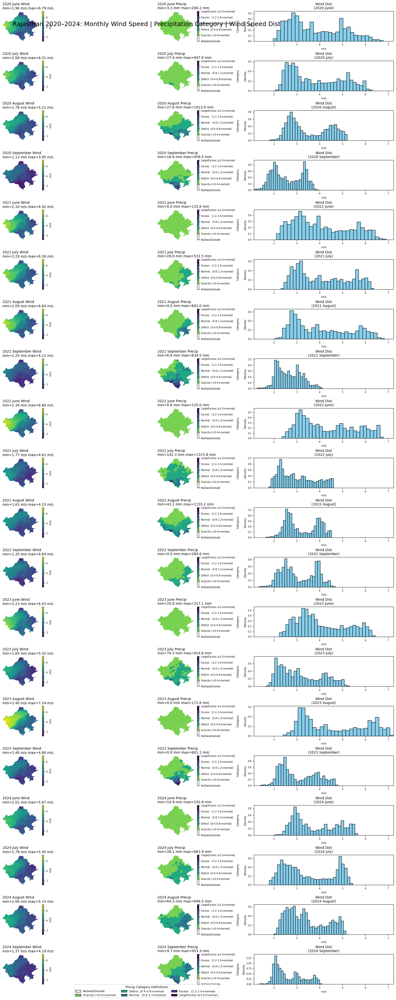

In [63]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - Wind Speed TIFF:       20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Raw Precip TIFF (CHIRPS): 25 bands (2020–2024 × 5 bands/year: Jun, Jul, Aug, Sep, Total)
#    - Precip Category TIFF: 25 bands (codes –1..4)
#    - Rajasthan shapefile:   "SateMask/gadm41_IND_1.shp" (vector mask of all Indian states)
# -----------------------------------------------------------------------------
wind_tiff_path        = "Rajasthan_X_Wind_Speed.tif"
precip_raw_tiff_path  = "Rajasthan_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Rajasthan_Y_Precipitation_GT_geotif.tif"
states_shapefile      = "SateMask/gadm41_IND_1.shp"

for p in (wind_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, states_shapefile):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND WIND SPEED TIFF
# -----------------------------------------------------------------------------
with rasterio.open(wind_tiff_path) as src_wind:
    wind_bands     = src_wind.read().astype(np.float32)  # shape = (20, H, W)
    wind_transform = src_wind.transform
    wind_crs       = src_wind.crs
    height, width  = src_wind.height, src_wind.width
    bounds         = src_wind.bounds

if wind_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {wind_tiff_path}, but found {wind_bands.shape[0]}")

# 2a) Load Rajasthan from the shapefile and reproject to wind CRS
gdf = gpd.read_file(states_shapefile)
gdf_rj = gdf[gdf["NAME_1"].str.lower() == "rajasthan"].copy()
if gdf_rj.empty:
    raise ValueError("No feature named 'Rajasthan' found in shapefile.")
if gdf_rj.crs != wind_crs:
    gdf_rj = gdf_rj.to_crs(wind_crs)

# 2b) Build a single geometry for Rajasthan
rj_geom = [gdf_rj.geometry.union_all()]

# 2c) Create boolean mask: True = inside Rajasthan
rj_mask = geometry_mask(
    rj_geom,
    transform=wind_transform,
    invert=True,
    out_shape=(height, width)
)

# 2d) Mask wind bands outside Rajasthan → NaN
for i in range(wind_bands.shape[0]):
    band = wind_bands[i]
    band[~rj_mask] = np.nan
    wind_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25‐BAND RAW PRECIPITATION TIFF (CHIRPS, units: mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # shape = (25, H, W)

if pr_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, but found {pr_raw_full.shape[0]}")

# Mask raw precipitation outside Rajasthan → NaN
for i in range(pr_raw_full.shape[0]):
    arr = pr_raw_full[i]
    arr[~rj_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # shape = (25, H, W)

if pr_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, but found {pr_cat_full.shape[0]}")

# Mask precip categories outside Rajasthan → code = -1
for i in range(pr_cat_full.shape[0]):
    arr = pr_cat_full[i]
    arr[~rj_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20‐MONTHLY PRECIPITATION BANDS
#    (drop each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_idx = []
for y in range(5):
    base = y * 5
    monthly_idx.extend([base + m for m in range(4)])

pr_raw_bands = pr_raw_full[monthly_idx, :, :]
pr_cat_bands = pr_cat_full[monthly_idx, :, :]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = len(years)
n_months    = len(month_names)
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & GLOBAL STATS
# -----------------------------------------------------------------------------
# 7a) Wind speed range
ws_vals = wind_bands.flatten()
ws_vals = ws_vals[~np.isnan(ws_vals)]
wind_vmin = float(np.nanmin(ws_vals)) if ws_vals.size else 0.0
wind_vmax = float(np.nanmax(ws_vals)) if ws_vals.size else 1.0
wind_cmap = plt.get_cmap("viridis")

# 7b) Precip category colormap (shift codes -1..4 → 0..5)
cluster_colors = [
    "#ffffff", "#79d151", "#22a784",
    "#29788e", "#404387", "#440154"
]
cluster_cmap = ListedColormap(cluster_colors)
cluster_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit  (0.4–0.8×normal)",
    3: "Normal   (0.8–1.2×normal)",
    4: "Excess   (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
cluster_handles = [
    Patch(facecolor=cluster_colors[i], edgecolor="black", label=cluster_labels[i])
    for i in range(6)
]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    n_total, 3,
    figsize=(20, n_total * 2.0),
    constrained_layout=True
)
fig.suptitle(
    "Rajasthan 2020–2024: Monthly Wind Speed | Precipitation Category | Wind Speed Dist",
    fontsize=18, y=0.98
)
if n_total == 1:
    axes = axes[np.newaxis, :]

for i in range(n_total):
    yr, mo = divmod(i, n_months)
    year, month = years[yr], month_names[mo]

    # Wind speed stats
    ws = wind_bands[i]
    valid_ws = ws[~np.isnan(ws)]
    ws_min = float(np.nanmin(valid_ws)) if valid_ws.size else np.nan
    ws_max = float(np.nanmax(valid_ws)) if valid_ws.size else np.nan

    # Precip stats
    pr = pr_raw_bands[i]
    valid_pr = pr[~np.isnan(pr)]
    pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else np.nan
    pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else np.nan

    # Category plot
    cat = pr_cat_bands[i]
    cat_plot = np.zeros(cat.shape, np.int8)
    mask = (cat != -1)
    cat_plot[mask] = cat[mask] + 1

    # Col 0: Wind map
    ax0 = axes[i, 0]
    im0 = ax0.imshow(ws, cmap=wind_cmap, vmin=wind_vmin, vmax=wind_vmax,
                     extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
                     origin="upper")
    ax0.set_title(f"{year} {month} Wind\nmin={ws_min:.2f} m/s max={ws_max:.2f} m/s",
                  loc="left", fontsize=10)
    ax0.axis("off")
    c0 = fig.colorbar(im0, ax=ax0, orientation="vertical",
                      fraction=0.045, pad=0.02)
    c0.set_label("m/s", fontsize=8)
    c0.ax.tick_params(labelsize=7)

    # Col 1: Precip cat map
    ax1 = axes[i, 1]
    im1 = ax1.imshow(cat_plot, cmap=cluster_cmap, vmin=0, vmax=5,
                     extent=[bounds.left, bounds.right, bounds.bottom, bounds.top],
                     origin="upper")
    ax1.set_title(f"{year} {month} Precip\nmin={pr_min:.1f} mm max={pr_max:.1f} mm",
                  loc="left", fontsize=10)
    ax1.axis("off")
    c1 = fig.colorbar(im1, ax=ax1, orientation="vertical",
                      fraction=0.045, pad=0.02)
    c1.set_ticks([0,1,2,3,4,5])
    c1.set_ticklabels([cluster_labels[i] for i in range(6)], fontsize=6)
    c1.ax.tick_params(labelsize=7)
    c1.set_label("Category", fontsize=8)

    # Col 2: Wind histogram
    ax2 = axes[i, 2]
    if valid_ws.size:
        ax2.hist(valid_ws, bins=30, density=True,
                 edgecolor="black", color="skyblue")
        ax2.set_xlim(wind_vmin, wind_vmax)
    else:
        ax2.text(0.5,0.5,"No Data", ha="center", va="center",
                 fontsize=8, color="gray")
    ax2.set_title(f"Wind Dist\n({year} {month})", fontsize=10)
    ax2.set_xlabel("m/s", fontsize=8)
    ax2.set_ylabel("Density", fontsize=8)
    ax2.tick_params(labelsize=7)

# -----------------------------------------------------------------------------
# 9) LEGEND FOR PRECIPITATION CATEGORIES AT BOTTOM CENTER
# -----------------------------------------------------------------------------
fig.legend(
    handles=cluster_handles,
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Category Definitions",
    bbox_to_anchor=(0.5, -0.005),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Rajasthan_X_LULC

In [ ]:
// --------------------------------------------------------------------------------
// Compute Monthly‐Mode LULC for Rajasthan (June–September, 2020–2024)
// using Google’s Dynamic World (“GOOGLE/DYNAMICWORLD/V1”). We will produce
// 5 years × 4 months = 20 single‐band images, stack them into one 20‐band
// GeoTIFF, and export it as “Rajasthan_X_LULC.tif”.
// --------------------------------------------------------------------------------

// 1. Load Rajasthan boundary from GAUL level1 and display it
var states     = ee.FeatureCollection("FAO/GAUL/2015/level1");
var rajasthan  = states.filter(ee.Filter.eq('ADM1_NAME', 'Rajasthan'));
Map.centerObject(rajasthan, 7);
Map.addLayer(rajasthan, { color: 'black' }, 'Rajasthan Boundary');

// 2. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 3. Build a list of single‐band LULC mode images (one per year & month)
var allBands = [];

// 3a. Loop over each year
years.forEach(function(year) {
  // 3b. Loop over each monsoon month
  months.forEach(function(m, idx) {
    // 3b.1 Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 3b.2 Load Dynamic World for that month & filter to Rajasthan
    var dw = ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1")
                .filterDate(start, end)
                .filterBounds(rajasthan);

    // 3b.3 Compute the pixel‐wise mode of the 'label' band (LULC) for the month,
    //       rename and clip to Rajasthan
    var modeImg = dw
                    .select('label')
                    .mode()
                    .rename(year + '_' + monthNames[idx] + '_LULC')
                    .clip(rajasthan);

    // 3b.4 (Optional) Print min/max classes to the Console for verification
    var stats = modeImg.reduceRegion({
      reducer:    ee.Reducer.minMax(),
      geometry:   rajasthan.geometry(),
      scale:      1000,
      bestEffort: true
    });
    print(year + ' ' + monthNames[idx] + ' LULC mode min/max:', stats);

    // 3b.5 Add this single‐band image to our list
    allBands.push(modeImg);
  });
});

// 4. Stack all 20 monthly bands into one multi‐band Image
var lulcStack = ee.Image.cat(allBands);

// 5. Rename bands explicitly to maintain chronological order
var bandNames20 = [];
years.forEach(function(year) {
  monthNames.forEach(function(mn) {
    bandNames20.push(year + '_' + mn + '_LULC');
  });
});
lulcStack = lulcStack.rename(bandNames20);

// 6. Export the 20‐band LULC image to Google Drive
Export.image.toDrive({
  image:          lulcStack,
  description:    'Rajasthan_X_LULC',  // Task name (no spaces)
  folder:         'GEE_Exports',       // Drive folder
  fileNamePrefix: 'Rajasthan_X_LULC',  // Output → “Rajasthan_X_LULC.tif”
  region:         rajasthan.geometry(),// Clip to Rajasthan boundary
  scale:          1000,                // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


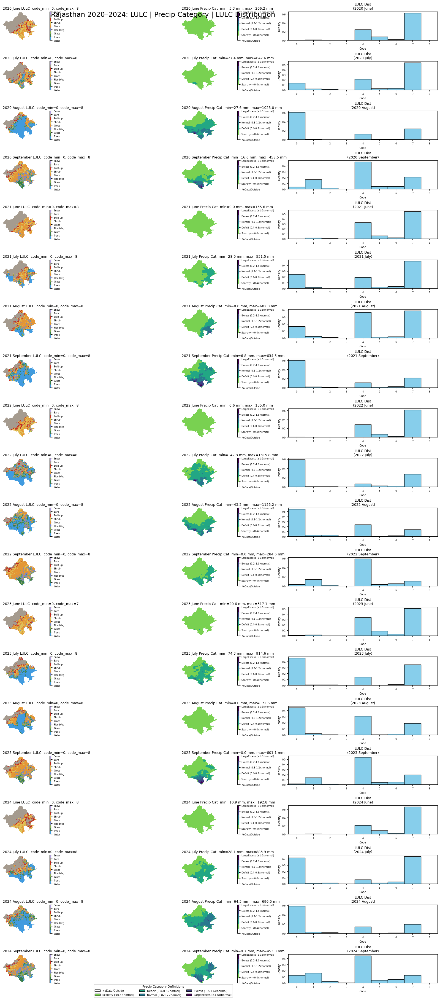

In [70]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
# -----------------------------------------------------------------------------
lulc_tiff_path        = "Rajasthan_X_LULC.tif"
precip_raw_tiff_path  = "Rajasthan_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Rajasthan_Y_Precipitation_GT_geotif.tif"
india_shapefile       = "SateMask/gadm41_IND_1.shp"  # contains all Indian states

for path in (lulc_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND LULC TIFF
# -----------------------------------------------------------------------------
with rasterio.open(lulc_tiff_path) as src:
    lulc_bands     = src.read().astype(np.float32)  # (20, H, W)
    transform      = src.transform
    crs            = src.crs
    height, width  = src.height, src.width
    bounds         = src.bounds

if lulc_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {lulc_tiff_path}, got {lulc_bands.shape[0]}")

# 2a) Load Rajasthan from the shapefile and reproject to match TIFF CRS
gdf = gpd.read_file(india_shapefile)
gdf_rj = gdf[gdf["NAME_1"].str.lower() == "rajasthan"].copy()
if gdf_rj.empty:
    raise ValueError("No feature named 'Rajasthan' found in shapefile.")
if gdf_rj.crs != crs:
    gdf_rj = gdf_rj.to_crs(crs)

# 2b) Build a single geometry for Rajasthan
geom = [gdf_rj.geometry.union_all()]

# 2c) Create mask where True = inside Rajasthan
mask = geometry_mask(geom, transform=transform, invert=True, out_shape=(height, width))

# 2d) Apply mask
for i in range(lulc_bands.shape[0]):
    band = lulc_bands[i]
    band[~mask] = np.nan
    lulc_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25‐BAND RAW PRECIPITATION TIFF (mm)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src:
    pr_raw_full = src.read().astype(np.float32)
if pr_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}, got {pr_raw_full.shape[0]}")
for i in range(25):
    arr = pr_raw_full[i]
    arr[~mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes –1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src:
    pr_cat_full = src.read().astype(np.int8)
if pr_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}, got {pr_cat_full.shape[0]}")
for i in range(25):
    arr = pr_cat_full[i]
    arr[~mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT 20 MONTHLY PRECIP BANDS (drop totals at idx 4,9,14,19,24)
# -----------------------------------------------------------------------------
idxs = []
for y in range(5):
    base = y * 5
    idxs.extend([base, base+1, base+2, base+3])
pr_raw_bands = pr_raw_full[idxs]
pr_cat_bands = pr_cat_full[idxs]

# -----------------------------------------------------------------------------
# 6) SETUP YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_months    = 4
n_total     = 20

# -----------------------------------------------------------------------------
# 7) COLORMAPS & STATISTICS
# -----------------------------------------------------------------------------
# 7a) Dynamic World LULC palette (0–8)
dw_palette = ['#419bdf','#397d49','#88b053','#7a87c6','#e49635',
              '#dfc35a','#c4281b','#a59b8f','#b39fe1']
lulc_cmap = ListedColormap(dw_palette)
# 7b) Precip category palette (shift -1..4 → 0..5)
cluster_colors = ['#ffffff','#79d151','#22a784','#29788e','#404387','#440154']
cluster_cmap   = ListedColormap(cluster_colors)
cluster_labels = {
    0:"NoData/Outside",1:"Scarcity (<0.4×normal)",2:"Deficit (0.4–0.8×normal)",
    3:"Normal (0.8–1.2×normal)",4:"Excess (1.2–1.6×normal)",5:"LargeExcess (≥1.6×normal)"
}
cluster_handles = [Patch(facecolor=cluster_colors[i], edgecolor='black', label=cluster_labels[i])
                   for i in range(6)]

# -----------------------------------------------------------------------------
# 8) PLOT 20 ROWS × 3 COLS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(nrows=n_total, ncols=3, figsize=(20, n_total*1.8), constrained_layout=True)
fig.suptitle("Rajasthan 2020–2024: LULC | Precip Category | LULC Distribution", fontsize=18, y=0.99)

if n_total == 1:
    axes = axes[np.newaxis,:]

for i in range(n_total):
    ry, rm = divmod(i, n_months)
    year, month = years[ry], month_names[rm]

    # LULC
    layer = lulc_bands[i]
    valid = layer[~np.isnan(layer)]
    ax0 = axes[i,0]
    im0 = ax0.imshow(layer, cmap=lulc_cmap, vmin=0, vmax=8,
                     extent=[bounds.left,bounds.right,bounds.bottom,bounds.top], origin='upper')
    title0 = f"{year} {month} LULC"
    if valid.size:
        title0 += f"  code_min={int(valid.min())}, code_max={int(valid.max())}"
    ax0.set_title(title0, loc='left', fontsize=9)
    ax0.axis('off')
    c0 = fig.colorbar(im0, ax=ax0, orientation='vertical', fraction=0.04, pad=0.02)
    c0.set_ticks(range(9))
    c0.ax.set_yticklabels(["Water","Trees","Grass","FloodVeg","Crops","Shrub","Built-up","Bare","Snow"], fontsize=6)
    c0.ax.tick_params(labelsize=6)

    # Precip Cat
    pr_layer = pr_raw_bands[i]
    pc_layer = pr_cat_bands[i]
    # shift category codes -1..4 → 0..5 for plotting
    cat = np.full(pc_layer.shape, 0, dtype=np.int8)
    m = pc_layer!=-1
    cat[m] = pc_layer[m] + 1
    ax1 = axes[i,1]
    im1 = ax1.imshow(cat, cmap=cluster_cmap, vmin=0, vmax=5,
                     extent=[bounds.left,bounds.right,bounds.bottom,bounds.top], origin='upper')
    valid_pr = pr_layer[~np.isnan(pr_layer)]
    title1 = f"{year} {month} Precip Cat"
    if valid_pr.size:
        title1 += f"  min={valid_pr.min():.1f} mm, max={valid_pr.max():.1f} mm"
    ax1.set_title(title1, loc='left', fontsize=9)
    ax1.axis('off')
    c1 = fig.colorbar(im1, ax=ax1, orientation='vertical', fraction=0.04, pad=0.02)
    c1.set_ticks([0,1,2,3,4,5])
    c1.set_ticklabels([cluster_labels[k] for k in range(6)], fontsize=6)
    c1.ax.tick_params(labelsize=6)

    # LULC histogram
    ax2 = axes[i,2]
    if valid.size:
        bins = np.arange(-0.5,9.5,1)
        ax2.hist(valid.flatten(), bins=bins, density=True, edgecolor='black', color='skyblue')
        ax2.set_xticks(range(9))
    else:
        ax2.text(0.5,0.5,"No Data",ha='center',va='center',color='gray',fontsize=8)
    ax2.set_xlim(-0.5,8.5)
    ax2.set_title(f"LULC Dist\n({year} {month})", fontsize=9)
    ax2.set_xlabel("Code", fontsize=7)
    ax2.set_ylabel("Density", fontsize=7)
    ax2.tick_params(labelsize=6)

# -----------------------------------------------------------------------------
# 9) LEGEND FIX: pass handles kw only
# -----------------------------------------------------------------------------
fig.legend(handles=cluster_handles,
           loc='lower center', ncol=3, frameon=True,
           title="Precip Category Definitions",
           bbox_to_anchor=(0.5, -0.005),
           fontsize=7, title_fontsize=8)

plt.show()


In [69]:
##Rajasthan_X_Soil_Moisture

In [ ]:

// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Soil Moisture for Rajasthan (June–September, 2020–2024)
// using ERA5‐Land Daily Aggregates (“ECMWF/ERA5_LAND/DAILY_AGGR”). We will produce
// 5 years × 4 months = 20 single-band images, stack them into one 20-band GeoTIFF,
// and export as “Rajasthan_X_Soil_Moisture.tif”.
// --------------------------------------------------------------------------------

// 1. Load Rajasthan boundary from GAUL level1 and display it
var states      = ee.FeatureCollection("FAO/GAUL/2015/level1");
var rajasthan   = states.filter(ee.Filter.eq('ADM1_NAME', 'Rajasthan'));
Map.centerObject(rajasthan, 6);
Map.addLayer(rajasthan, { color: 'black' }, 'Rajasthan Boundary');

// 2. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 3. Build a list of single-band soil-moisture images (one per year & month)
var allBands = [];

// 3a. Loop over each year
years.forEach(function(year) {
  // 3b. Loop over each monsoon month
  months.forEach(function(m, idx) {
    // 3b.1 Define start/end dates for this month
    var start = ee.Date.fromYMD(year, m, 1);
    var end   = start.advance(1, 'month');

    // 3b.2 Load ERA5-Land Daily Aggregates for this month & Rajasthan, selecting layer 1 soil moisture
    var smColl = ee.ImageCollection("ECMWF/ERA5_LAND/DAILY_AGGR")
                    .filterDate(start, end)
                    .filterBounds(rajasthan)
                    .select('volumetric_soil_water_layer_1');

    // 3b.3 Compute monthly mean soil moisture, clip to Rajasthan, rename band
    var monthlySM = smColl
                      .mean()
                      .clip(rajasthan)
                      .rename(year + '_' + monthNames[idx] + '_SM');

    // 3b.4 (Optional) Print min/max to the Console for verification
    var stats = monthlySM.reduceRegion({
      reducer:    ee.Reducer.minMax(),
      geometry:   rajasthan.geometry(),
      scale:      1000,
      bestEffort: true
    });
    print(year + ' ' + monthNames[idx] + ' Soil Moisture min/max:', stats);

    // 3b.5 Add this single-band image to the list
    allBands.push(monthlySM);

    // 3b.6 (Optional) Visualize each monthly soil-moisture layer on the map
    Map.addLayer(
      monthlySM,
      {
        min: 0.05,
        max: 0.55,
        palette: ['white', 'lightblue', 'navyblue', 'blue', 'darkblue']
      },
      year + ' ' + monthNames[idx] + ' Soil Moisture'
    );
  });
});

// 4. Stack all 20 monthly bands into one multi-band Image
var soilMoistureMultiband = ee.Image.cat(allBands);

// 5. Export the 20-band soil-moisture image to Google Drive
Export.image.toDrive({
  image:          soilMoistureMultiband,
  description:    'Rajasthan_X_Soil_Moisture',   // Task name
  folder:         'GEE_Exports',                 // Drive folder
  fileNamePrefix: 'Rajasthan_X_Soil_Moisture',   // Output → “Rajasthan_X_Soil_Moisture.tif”
  region:         rajasthan.geometry(),          // Clip to Rajasthan boundary
  scale:          1000,                          // 1 km resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});


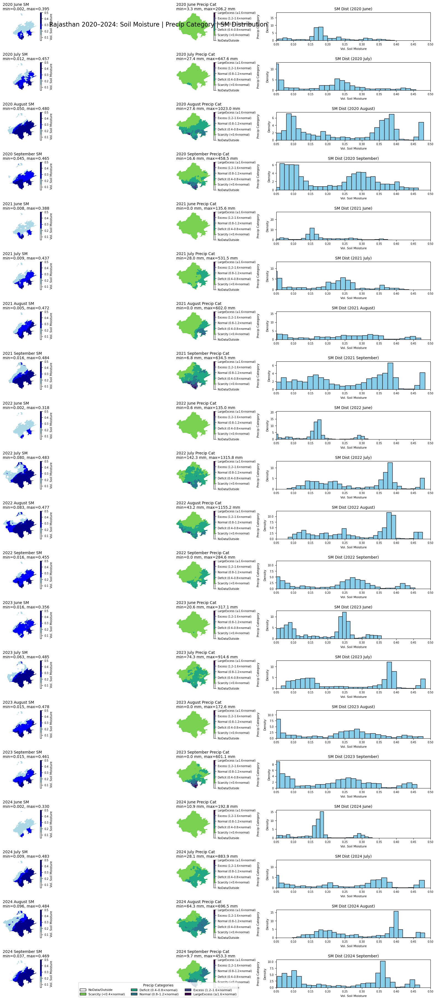

In [75]:
import os
import rasterio
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust as needed)
#    - Soil Moisture TIFF:          20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Raw Precipitation TIFF:      25 bands (2020–2024 × 5 bands each: June, July, August, September, Total)
#    - Precipitation Category TIFF: 25 bands (2020–2024 × 5 category bands)
#    - Rajasthan mask shapefile:    "SateMask/gadm41_IND_1.shp"
# -----------------------------------------------------------------------------
sm_tiff_path        = "Rajasthan_X_Soil_Moisture.tif"
precip_raw_tiff     = "Rajasthan_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff     = "Rajasthan_Y_Precipitation_GT_geotif.tif"
india_shapefile     = "SateMask/gadm41_IND_1.shp"

for path in (sm_tiff_path, precip_raw_tiff, precip_cat_tiff, india_shapefile):
    if not os.path.isfile(path):
        raise FileNotFoundError(f"Cannot find {path!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20‐BAND SOIL MOISTURE TIFF
# -----------------------------------------------------------------------------
with rasterio.open(sm_tiff_path) as src_sm:
    sm_bands      = src_sm.read().astype(np.float32)  # shape = (20, H, W)
    sm_transform  = src_sm.transform
    sm_crs        = src_sm.crs
    height, width = src_sm.height, src_sm.width
    bounds        = src_sm.bounds

if sm_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {sm_tiff_path}, found {sm_bands.shape[0]}")

# 2a) Load Rajasthan from the shapefile & reproject to SM CRS
gdf = gpd.read_file(india_shapefile)
gdf_state = gdf[gdf["NAME_1"].str.lower() == "rajasthan"].copy()
if gdf_state.empty:
    raise ValueError("No feature named 'Rajasthan' found in shapefile.")
if gdf_state.crs != sm_crs:
    gdf_state = gdf_state.to_crs(sm_crs)

# 2b) Union geometry & build mask
state_geom = [gdf_state.geometry.union_all()]
state_mask = geometry_mask(
    state_geom,
    transform=sm_transform,
    invert=True,
    out_shape=(height, width)
)

# 2c) Mask out pixels outside Rajasthan
for i in range(sm_bands.shape[0]):
    band = sm_bands[i]
    band[~state_mask] = np.nan
    sm_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK THE 25‐BAND RAW PRECIPITATION TIFF
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # shape = (25, H, W)

if pr_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff}, found {pr_raw_full.shape[0]}")

for i in range(pr_raw_full.shape[0]):
    arr = pr_raw_full[i]
    arr[~state_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK THE 25‐BAND PRECIPITATION CATEGORY TIFF (codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # shape = (25, H, W)

if pr_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff}, found {pr_cat_full.shape[0]}")

for i in range(pr_cat_full.shape[0]):
    arr = pr_cat_full[i]
    arr[~state_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIPITATION BANDS
#    (drop each year's “Total” at indices 4, 9, 14, 19, 24)
# -----------------------------------------------------------------------------
monthly_indices = []
for y in range(5):
    base = y * 5
    monthly_indices.extend([base + m for m in range(4)])

pr_raw_bands = pr_raw_full[monthly_indices]
pr_cat_bands = pr_cat_full[monthly_indices]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_months    = len(month_names)
n_total     = len(years) * n_months  # 20

# -----------------------------------------------------------------------------
# 7) PREPARE COLORMAPS & STATISTICS
# -----------------------------------------------------------------------------
# 7a) Soil moisture colormap & range
sm_cmap = ListedColormap(["white","lightblue","blue","darkblue","navy"])
sm_vmin, sm_vmax = 0.05, 0.5

# 7b) Precip category colormap
cluster_colors = [
    "#ffffff", "#79d151", "#22a784",
    "#29788e", "#404387", "#440154"
]
pr_cmap = ListedColormap(cluster_colors)
pr_labels = {
    0: "NoData/Outside",
    1: "Scarcity (<0.4×normal)",
    2: "Deficit (0.4–0.8×normal)",
    3: "Normal (0.8–1.2×normal)",
    4: "Excess (1.2–1.6×normal)",
    5: "LargeExcess (≥1.6×normal)"
}
pr_handles = [Patch(facecolor=cluster_colors[i], edgecolor="black", label=pr_labels[i])
              for i in range(len(cluster_colors))]

# -----------------------------------------------------------------------------
# 8) BUILD FIGURE: 20 ROWS × 3 COLUMNS
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(
    nrows=n_total,
    ncols=3,
    figsize=(20, n_total * 1.8),
    constrained_layout=True
)
fig.suptitle(
    "Rajasthan 2020–2024: Soil Moisture | Precip Category | SM Distribution",
    fontsize=16, y=0.98
)

# If single row, force 2D
if n_total == 1:
    axes = axes[np.newaxis, :]

for i in range(n_total):
    yr_idx, mo_idx = divmod(i, n_months)
    year, month = years[yr_idx], month_names[mo_idx]

    # Soil moisture layer & stats
    sm_layer = sm_bands[i]
    valid_sm = sm_layer[~np.isnan(sm_layer)]
    sm_min = float(np.nanmin(valid_sm)) if valid_sm.size else None
    sm_max = float(np.nanmax(valid_sm)) if valid_sm.size else None

    # Precip raw & stats
    pr_layer = pr_raw_bands[i]
    valid_pr = pr_layer[~np.isnan(pr_layer)]
    pr_min = float(np.nanmin(valid_pr)) if valid_pr.size else None
    pr_max = float(np.nanmax(valid_pr)) if valid_pr.size else None

    # Precip category (shift -1..4 → 0..5)
    cat = pr_cat_bands[i]
    cat_plot = np.zeros_like(cat, dtype=np.int8)
    mask_valid = (cat != -1)
    cat_plot[mask_valid] = cat[mask_valid] + 1

    # Column 0: Soil Moisture Map
    ax0 = axes[i,0]
    im0 = ax0.imshow(sm_layer, cmap=sm_cmap, vmin=sm_vmin, vmax=sm_vmax,
                     extent=[bounds.left,bounds.right,bounds.bottom,bounds.top],
                     origin="upper")
    title0 = f"{year} {month} SM"
    if sm_min is not None:
        title0 += f"\nmin={sm_min:.3f}, max={sm_max:.3f}"
    ax0.set_title(title0, loc="left", fontsize=10)
    ax0.axis("off")
    c0 = fig.colorbar(im0, ax=ax0, orientation="vertical", fraction=0.04, pad=0.02)
    c0.set_label("Vol. Soil Moisture", fontsize=8)
    c0.ax.tick_params(labelsize=7)

    # Column 1: Precip Category Map
    ax1 = axes[i,1]
    im1 = ax1.imshow(cat_plot, cmap=pr_cmap, vmin=0, vmax=5,
                     extent=[bounds.left,bounds.right,bounds.bottom,bounds.top],
                     origin="upper")
    title1 = f"{year} {month} Precip Cat"
    if pr_min is not None:
        title1 += f"\nmin={pr_min:.1f} mm, max={pr_max:.1f} mm"
    ax1.set_title(title1, loc="left", fontsize=10)
    ax1.axis("off")
    c1 = fig.colorbar(im1, ax=ax1, orientation="vertical", fraction=0.04, pad=0.02)
    c1.set_ticks([0,1,2,3,4,5])
    c1.set_ticklabels([pr_labels[i] for i in range(6)], fontsize=6)
    c1.ax.tick_params(labelsize=7)
    c1.set_label("Precip Category", fontsize=8)

    # Column 2: Soil Moisture Distribution
    ax2 = axes[i,2]
    if valid_sm.size:
        ax2.hist(valid_sm.flatten(), bins=30, density=True,
                 edgecolor="black", color="skyblue")
        ax2.set_xlim(sm_vmin, sm_vmax)
    else:
        ax2.text(0.5,0.5,"No Data", ha="center", va="center",
                 fontsize=8, color="gray")
    ax2.set_title(f"SM Dist ({year} {month})", fontsize=10)
    ax2.set_xlabel("Vol. Soil Moisture", fontsize=8)
    ax2.set_ylabel("Density", fontsize=8)
    ax2.tick_params(labelsize=7)

# Legend for Precip Categories
fig.legend(
    handles=pr_handles,
    labels=[pr_labels[i] for i in range(6)],
    loc="lower center",
    ncol=3,
    frameon=True,
    title="Precip Categories",
    bbox_to_anchor=(0.5, 0.00),
    fontsize=8,
    title_fontsize=9
)

plt.show()


In [ ]:
##Rajasthan_X_elevation

In [ ]:

// --------------------------------------------------------------------------------
// Compute Monthly‐Mean Elevation for Rajasthan (June–September, 2020–2024)
// using the SRTM DEM as a static elevation source. Stack all 20 clipped bands into
// one 20‐band GeoTIFF named “Rajasthan_X_Elevation.tif”.
// --------------------------------------------------------------------------------

// 0. Load Indian states boundary and filter for Rajasthan
var states    = ee.FeatureCollection("FAO/GAUL/2015/level1");
var rajasthan = states.filter(ee.Filter.eq('ADM1_NAME', 'Rajasthan'));
Map.centerObject(rajasthan, 6);
Map.addLayer(rajasthan, { color: 'black' }, 'Rajasthan Boundary');

// 1. Define the years (2020–2024) and monsoon months (June–September)
var years      = [2020, 2021, 2022, 2023, 2024];
var months     = [6, 7, 8, 9];
var monthNames = ['June', 'July', 'August', 'September'];

// 2. Load the SRTM elevation dataset (single‐band, static 30 m DEM)
var srtm = ee.Image("USGS/SRTMGL1_003");

// 3. Prepare a list to hold all 20 clipped & renamed elevation bands
var allBands = [];

// 4. Loop over each year & month to clip and rename the elevation band
years.forEach(function(year) {
  months.forEach(function(m, idx) {
    // 4.1 Clip the SRTM DEM to Rajasthan for this “month”
    var clippedElev = srtm
      .clip(rajasthan)
      .rename(year + '_' + monthNames[idx] + '_Elev');

    // 4.2 (Optional) Visualize each clipped elevation on the map
    Map.addLayer(
      clippedElev,
      {
        min: 0,
        max: 3000,
        palette: ['blue', 'green', 'yellow', 'brown', 'white']
      },
      year + ' ' + monthNames[idx] + ' Elevation'
    );

    // 4.3 Add the renamed band to our list
    allBands.push(clippedElev);
  });
});

// 5. Stack all 20 clipped elevation bands into one multi‐band image
var elevMultiband = ee.Image.cat(allBands);

// 6. Export the 20‐band Elevation image to Google Drive
Export.image.toDrive({
  image:          elevMultiband,
  description:    'Rajasthan_X_Elevation',   // Task name
  folder:         'GEE_Exports',             // Drive folder
  fileNamePrefix: 'Rajasthan_X_Elevation',   // Output → “Rajasthan_X_Elevation.tif”
  region:         rajasthan.geometry(),      // Clip to Rajasthan boundary
  scale:          1000,                      // ~30 m resolution
  crs:            'EPSG:4326',
  maxPixels:      1e13
});

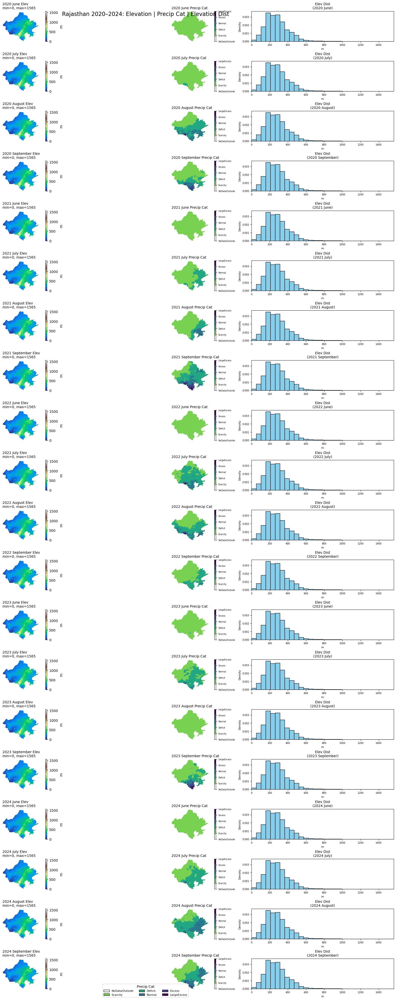

In [80]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from rasterio.features import geometry_mask

# -----------------------------------------------------------------------------
# 1) FILE PATHS (adjust if needed)
#    - Elevation TIFF:      20 bands (2020–2024 × 4 months: June, July, August, September)
#    - Raw Precip TIFF:     25 bands (2020–2024 × 5 bands/year: Jun, Jul, Aug, Sep, Total)
#    - Precip Category TIFF:25 bands (same order, codes –1..4)
#    - India shapefile:     "SateMask/gadm41_IND_1.shp" (vector mask of all states)
# -----------------------------------------------------------------------------
elev_tiff_path        = "Rajasthan_X_Elevation.tif"
precip_raw_tiff_path  = "Rajasthan_Y_Precipitation_CHIRPS.tif"
precip_cat_tiff_path  = "Rajasthan_Y_Precipitation_GT_geotif.tif"
india_shapefile       = "SateMask/gadm41_IND_1.shp"

for p in (elev_tiff_path, precip_raw_tiff_path, precip_cat_tiff_path, india_shapefile):
    if not os.path.isfile(p):
        raise FileNotFoundError(f"Cannot find {p!r} in {os.getcwd()}")

# -----------------------------------------------------------------------------
# 2) READ & MASK THE 20-BAND ELEVATION TIFF (June–September, 2020–2024)
# -----------------------------------------------------------------------------
with rasterio.open(elev_tiff_path) as src_elev:
    elev_bands     = src_elev.read().astype(np.float32)  # (20, H, W)
    elev_transform = src_elev.transform
    elev_crs       = src_elev.crs
    height, width  = src_elev.height, src_elev.width
    bounds         = src_elev.bounds

if elev_bands.shape[0] != 20:
    raise ValueError(f"Expected 20 bands in {elev_tiff_path}")

# 2a) Load India shapefile & extract Rajasthan, reproject to match DEM CRS
gdf = gpd.read_file(india_shapefile)
gdf_raj = gdf[gdf["NAME_1"].str.lower() == "rajasthan"].to_crs(elev_crs)
if gdf_raj.empty:
    raise ValueError("No feature named 'Rajasthan' found in shapefile.")

# 2b) Build unioned geometry for Rajasthan
raj_geom = [gdf_raj.geometry.union_all()]

# 2c) Mask: True inside Rajasthan
raj_mask = geometry_mask(
    raj_geom,
    transform=elev_transform,
    invert=True,
    out_shape=(height, width)
)

# 2d) Set elevation outside Rajasthan to NaN
for i in range(20):
    band = elev_bands[i]
    band[~raj_mask] = np.nan
    elev_bands[i] = band

# -----------------------------------------------------------------------------
# 3) READ & MASK RAW PRECIPITATION TIFF (25 bands)
# -----------------------------------------------------------------------------
with rasterio.open(precip_raw_tiff_path) as src_pr:
    pr_raw_full = src_pr.read().astype(np.float32)  # (25, H, W)

if pr_raw_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_raw_tiff_path}")

for i in range(25):
    arr = pr_raw_full[i]
    arr[~raj_mask] = np.nan
    pr_raw_full[i] = arr

# -----------------------------------------------------------------------------
# 4) READ & MASK PRECIPITATION CATEGORY TIFF (25 bands, codes -1..4)
# -----------------------------------------------------------------------------
with rasterio.open(precip_cat_tiff_path) as src_pc:
    pr_cat_full = src_pc.read().astype(np.int8)  # (25, H, W)

if pr_cat_full.shape[0] != 25:
    raise ValueError(f"Expected 25 bands in {precip_cat_tiff_path}")

for i in range(25):
    arr = pr_cat_full[i]
    arr[~raj_mask] = -1
    pr_cat_full[i] = arr

# -----------------------------------------------------------------------------
# 5) EXTRACT THE 20 MONTHLY PRECIP BANDS (drop “Total” at indices 4,9,14,19,24)
# -----------------------------------------------------------------------------
monthly_idx = []
for y in range(5):
    base = y*5
    monthly_idx += [base, base+1, base+2, base+3]

pr_raw_bands = pr_raw_full[monthly_idx]
pr_cat_bands = pr_cat_full[monthly_idx]

# -----------------------------------------------------------------------------
# 6) DEFINE YEARS & MONTHS
# -----------------------------------------------------------------------------
years       = [2020, 2021, 2022, 2023, 2024]
month_names = ["June", "July", "August", "September"]
n_years     = 5
n_months    = 4
n_total     = n_years * n_months  # 20

# -----------------------------------------------------------------------------
# 7) COLORMAPS & GLOBAL STATS
# -----------------------------------------------------------------------------
# Elevation colormap
vals = elev_bands.flatten()
vals = vals[~np.isnan(vals)]
elev_vmin = float(np.nanmin(vals)) if vals.size else 0.0
elev_vmax = float(np.nanmax(vals)) if vals.size else 0.0
elev_cmap = plt.get_cmap("terrain")

# Precip category colormap (0..5)
cat_colors = ["#ffffff","#79d151","#22a784","#29788e","#404387","#440154"]
cat_cmap = ListedColormap(cat_colors)
cat_labels = {
    0:"NoData/Outside",1:"Scarcity",2:"Deficit",
    3:"Normal",4:"Excess",5:"LargeExcess"
}
cat_handles = [Patch(facecolor=cat_colors[i],edgecolor="black",label=cat_labels[i])
               for i in range(6)]

# -----------------------------------------------------------------------------
# 8) PLOT: 20 rows × 3 cols [Elevation|PrecipCat|minmax]
# -----------------------------------------------------------------------------
fig, axes = plt.subplots(n_total,3,figsize=(20,n_total*2),constrained_layout=True)
fig.suptitle("Rajasthan 2020–2024: Elevation | Precip Cat | Elevation Dist",fontsize=16,y=0.99)
if n_total==1: axes=axes[np.newaxis,:]

for i in range(n_total):
    yr = years[i//n_months]
    mo = month_names[i%n_months]

    # Elevation map
    ax0=axes[i,0]
    im0=ax0.imshow(elev_bands[i],cmap=elev_cmap,vmin=elev_vmin,vmax=elev_vmax,
                   extent=[bounds.left,bounds.right,bounds.bottom,bounds.top],origin="upper")
    ax0.set_title(f"{yr} {mo} Elev\nmin={np.nanmin(elev_bands[i]):.0f}, max={np.nanmax(elev_bands[i]):.0f}",loc="left",fontsize=10)
    ax0.axis("off")
    fig.colorbar(im0,ax=ax0,fraction=0.04,pad=0.04).set_label("m")

    # Precip category map
    cat = pr_cat_bands[i]
    plot_cat = np.full(cat.shape,0,dtype=int)
    mask = cat!=-1
    plot_cat[mask]=cat[mask]+1
    ax1=axes[i,1]
    im1=ax1.imshow(plot_cat,cmap=cat_cmap,vmin=0,vmax=5,
                   extent=[bounds.left,bounds.right,bounds.bottom,bounds.top],origin="upper")
    ax1.set_title(f"{yr} {mo} Precip Cat",loc="left",fontsize=10)
    ax1.axis("off")
    cbar1=fig.colorbar(im1,ax=ax1,fraction=0.04,pad=0.04,ticks=range(6))
    cbar1.ax.set_yticklabels([cat_labels[j] for j in range(6)],fontsize=6)

    # Elevation distribution
    ax2=axes[i,2]
    data=elev_bands[i][~np.isnan(elev_bands[i])]
    if data.size:
        ax2.hist(data.flatten(),bins=30,density=True,edgecolor="black",color="skyblue")
        ax2.set_xlim(elev_vmin,elev_vmax)
    ax2.set_title(f"Elev Dist\n({yr} {mo})",fontsize=10)
    ax2.set_xlabel("m",fontsize=8)
    ax2.set_ylabel("Density",fontsize=8)
    ax2.tick_params(labelsize=7)

# Legend
fig.legend(handles=cat_handles,loc="lower center",ncol=3,frameon=True,
           title="Precip Cat",bbox_to_anchor=(0.5,0.00),fontsize=8)
plt.show()
